# Master Thesis - Vignoli Lorenzo

---

## 🐙 Helyx testing

## ⚙️ Import Libraries

In [18]:
# Libraries
import os
import glob
import random
import warnings
import numpy as np # type: ignore
from sklearn.model_selection import train_test_split # type: ignore

import torch # type: ignore
import torch.nn as nn # type: ignore
import torch.optim as optim # type: ignore
from torch.utils.data import Dataset, DataLoader, RandomSampler # type: ignore
import torch.nn.functional as F # type: ignore
import shutil
import plotly.graph_objects as go # type: ignore
from torch.optim.lr_scheduler import LinearLR, ReduceLROnPlateau # type: ignore
import torchvision.transforms as T
import torchvision.transforms.functional as TF

import matplotlib.pyplot as plt # type: ignore
import seaborn as sns # type: ignore
import matplotlib as mpl # type: ignore
from matplotlib import rcParams # type: ignore
from cycler import cycler # type: ignore
import sys
from torch.amp import GradScaler, autocast # type: ignore
import pandas as pd # type: ignore

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from scipy.spatial.transform import Rotation as R
from scipy.linalg import solve
from numpy.linalg import lstsq
from scipy.linalg import null_space
import torchvision.models as models
from torchvision.models import mobilenet_v2
from tqdm import tqdm # type: ignore
from scipy.integrate import cumulative_trapezoid
from matplotlib import gridspec

# Reconstruction utility
from SINGLE_reconstruction_utility import *

# PCC model
from SINGLE_jacobians import *
from SINGLE_kinematics import *

# Publication-ready plotting setup with TRUE LaTeX rendering
rcParams.update({
   'figure.figsize': (6, 4), 'figure.dpi': 300, 'savefig.dpi': 300,
   'savefig.format': 'pdf', 'savefig.bbox': 'tight', 'savefig.pad_inches': 0.1,
   'font.family': 'serif', 'font.serif': ['Computer Modern Roman', 'Times New Roman', 'DejaVu Serif'],
   'font.size': 10, 'axes.titlesize': 12, 'axes.labelsize': 10,
   'xtick.labelsize': 9, 'ytick.labelsize': 9, 'legend.fontsize': 9,
   'lines.linewidth': 1.5, 'lines.markersize': 6, 'lines.markeredgewidth': 0.5,
   'axes.linewidth': 1.0, 'axes.spines.top': False, 'axes.spines.right': False,
   'axes.grid': True, 'axes.edgecolor': 'black',
   'xtick.direction': 'in', 'ytick.direction': 'in',
   'xtick.major.size': 4, 'ytick.major.size': 4,
   'xtick.minor.size': 2, 'ytick.minor.size': 2,
   'xtick.minor.visible': True, 'ytick.minor.visible': True,
   'grid.color': 'gray', 'grid.linestyle': '-', 'grid.linewidth': 0.5, 'grid.alpha': 0.3,
   'legend.frameon': True, 'legend.framealpha': 0.9, 'legend.fancybox': False,
   'legend.edgecolor': 'black', 'legend.facecolor': 'white', 'legend.numpoints': 1,
   'text.usetex': True,  # TRUE LaTeX rendering
   'mathtext.default': 'regular',
   'axes.unicode_minus': False,
   'text.latex.preamble': r'\usepackage{amsmath}\usepackage{amsfonts}\usepackage{amssymb}'
})

sns.set_style("whitegrid", {"axes.spines.left": True, "axes.spines.bottom": True,
                          "axes.spines.top": False, "axes.spines.right": False,
                          "grid.color": "0.8", "grid.linestyle": "-", "grid.linewidth": 0.5})
pub_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
             '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
sns.set_palette(pub_colors)
rcParams['axes.prop_cycle'] = cycler('color', pub_colors)

# Ignore warnings
warnings.filterwarnings("ignore")
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark = False

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print("True LaTeX rendering enabled - all text will be compiled with LaTeX")

Using device: cuda
True LaTeX rendering enabled - all text will be compiled with LaTeX


## ⏳ Load and process the Data

In [2]:
if False:

    for split in ["train", "val", "test"]:
        shutil.rmtree(f"images/{split}", ignore_errors=True)
        shutil.rmtree(f"y/{split}", ignore_errors=True)
        shutil.rmtree(f"DELTAL/{split}", ignore_errors=True)
        shutil.rmtree(f"quad/{split}", ignore_errors=True)
        shutil.rmtree(f"affine/{split}", ignore_errors=True)
        shutil.rmtree(f"const/{split}", ignore_errors=True)
        shutil.rmtree(f"poly/{split}", ignore_errors=True)
        os.makedirs(f"images/{split}", exist_ok=True)
        os.makedirs(f"y/{split}", exist_ok=True)
        os.makedirs(f"DELTAL/{split}", exist_ok=True)
        os.makedirs(f"quad/{split}", exist_ok=True)
        os.makedirs(f"affine/{split}", exist_ok=True)
        os.makedirs(f"const/{split}", exist_ok=True)
        os.makedirs(f"poly/{split}", exist_ok=True)

    dataset_files = sorted(glob.glob("Dataset*.pt"))
    total_originals = sum([len(torch.load(f)["X_images"]) for f in dataset_files])
    all_indices = np.arange(total_originals)

    train_idx, temp_idx = train_test_split(all_indices, test_size=0.15)
    val_idx, test_idx = train_test_split(temp_idx, test_size=1/3)

    split_map = np.full(total_originals, "", dtype=object)
    split_map[train_idx] = "train"
    split_map[val_idx] = "val"
    split_map[test_idx] = "test"

    global_index = {
        "train": 0,
        "val": 0,
        "test": 0
    }

    current_idx = 0

    for file in dataset_files:

        print(f"\n Processing {file}...")
        data = torch.load(file)
        X_images = data["X_images"]
        y = data["y"]
        X_DELTAL = data["X_DELTAL"]
        quad = data["X_quad"]
        affine = data["X_affine"]
        const = data["X_const"]
        poly = data["X_poly"]

        for i in range(len(X_images)):

            split = split_map[current_idx]
            idx_str = f"{global_index[split]:06d}"

            torch.save(X_images[i], f"images/{split}/img_{idx_str}.pt")
            torch.save(y[i],         f"y/{split}/y_{idx_str}.pt")
            torch.save(X_DELTAL[i],  f"DELTAL/{split}/deltal_{idx_str}.pt")
            torch.save(quad[i], f"quad/{split}/quad_{idx_str}.pt")
            torch.save(affine[i], f"affine/{split}/affine_{idx_str}.pt")
            torch.save(const[i], f"const/{split}/const_{idx_str}.pt")
            torch.save(poly[i], f"poly/{split}/poly_{idx_str}.pt")

            global_index[split] += 1
            current_idx += 1

            percent = (current_idx / total_originals) * 100
            sys.stdout.write(f"\rProgress: {percent:.2f}%")
            sys.stdout.flush()

        del X_images, y, X_DELTAL, quad, affine, const, poly

    for split in ["train", "val", "test"]:
        shutil.rmtree(f"inputs/{split}", ignore_errors=True)
        shutil.rmtree(f"labels/{split}", ignore_errors=True)
        os.makedirs(f"inputs/{split}", exist_ok=True)
        os.makedirs(f"labels/{split}", exist_ok=True)

    dataset_files = sorted(glob.glob("Dataset*.pt"))
    total_originals = sum([len(torch.load(f)["X_images"]) for f in dataset_files])
    all_indices = np.arange(total_originals)

    train_idx, temp_idx = train_test_split(all_indices, test_size=0.15)
    val_idx, test_idx = train_test_split(temp_idx, test_size=1/3)

    split_map = np.full(total_originals, "", dtype=object)
    split_map[train_idx] = "train"
    split_map[val_idx] = "val"
    split_map[test_idx] = "test"

    global_index = {
        "train": 0,
        "val": 0,
        "test": 0
    }

    current_idx = 0

    for file in dataset_files:

        print(f"\n Processing {file}...")
        data = torch.load(file)
        y = data["y"]
        X_DELTAL = data["X_DELTAL"]

        for i in range(len(y)):

            split = split_map[current_idx]
            input_tensor = y[i][:3]
            label_tensor = X_DELTAL[i]

            idx_str = f"{global_index[split]:06d}"

            torch.save(input_tensor, f"inputs/{split}/input_{idx_str}.pt")
            torch.save(label_tensor, f"labels/{split}/label_{idx_str}.pt")

            global_index[split] = global_index[split] + 1
            current_idx += 1

            percent = (current_idx / total_originals) * 100
            sys.stdout.write(f"\rProgress: {percent:.2f}%")
            sys.stdout.flush()

        del y
        del X_DELTAL

    print("\n Finished dataset generation.")

In [3]:
if False:
    # --- y (target position + orientation) ---
    y_paths = sorted(glob.glob("y/train/*.pt"))
    all_y = torch.stack([torch.load(p).float() for p in y_paths])
    mean_y = all_y.mean(dim=0)
    std_y = all_y.std(dim=0)
    torch.save({'mean': mean_y, 'std': std_y}, 'label_stats.pt')
    del all_y, mean_y, std_y

    # --- quad (shape descriptors) ---
    backbone_paths = sorted(glob.glob("quad/train/*.pt"))
    all_backbones = torch.stack([torch.load(p).float().view(-1) for p in backbone_paths])
    mean_backbone = all_backbones.mean(dim=0)
    std_backbone = all_backbones.std(dim=0)
    torch.save({'mean': mean_backbone, 'std': std_backbone}, 'quad_stats.pt')
    del all_backbones, mean_backbone, std_backbone

    # --- affine (shape descriptors) ---
    backbone_paths = sorted(glob.glob("affine/train/*.pt"))
    all_backbones = torch.stack([torch.load(p).float().view(-1) for p in backbone_paths])
    mean_backbone = all_backbones.mean(dim=0)
    std_backbone = all_backbones.std(dim=0)
    torch.save({'mean': mean_backbone, 'std': std_backbone}, 'affine_stats.pt')
    del all_backbones, mean_backbone, std_backbone

    # --- const (shape descriptors) ---
    backbone_paths = sorted(glob.glob("const/train/*.pt"))
    all_backbones = torch.stack([torch.load(p).float().view(-1) for p in backbone_paths])
    mean_backbone = all_backbones.mean(dim=0)
    std_backbone = all_backbones.std(dim=0)
    torch.save({'mean': mean_backbone, 'std': std_backbone}, 'const_stats.pt')
    del all_backbones, mean_backbone, std_backbone

    # --- poly (shape descriptors) ---
    backbone_paths = sorted(glob.glob("poly/train/*.pt"))
    all_backbones = torch.stack([torch.load(p).float().view(-1) for p in backbone_paths])
    mean_backbone = all_backbones.mean(dim=0)
    std_backbone = all_backbones.std(dim=0)
    torch.save({'mean': mean_backbone, 'std': std_backbone}, 'poly_stats.pt')
    del all_backbones, mean_backbone, std_backbone

    # --- inverse kinematics ---
    label_paths = sorted(glob.glob("labels/train/*.pt"))
    all_labels = torch.stack([torch.load(p).float() for p in label_paths])
    mean = all_labels.mean(dim=0)
    std = all_labels.std(dim=0)
    torch.save({'mean': mean, 'std': std}, 'deltal_stats.pt')
    del mean, std
    

In [4]:
# Collect all label files to define the workspace
label_files = sorted(glob.glob("inputs/*/input_*.pt"))

# Extract positions
positions = []
for f in label_files:
    label = torch.load(f)[:3]
    positions.append(label.numpy())

# Define (N, 3) matrix
XYZ_matrix = np.stack(positions)

# Save in .npz format
np.savez_compressed("Workspace.npz", xyz=XYZ_matrix)
print(f"Workspace density: {XYZ_matrix.shape}")

# Load the workspace from file
data = np.load("Workspace.npz")
x = data["xyz"]  # shape: (N, 3), so x[i] = [x, y, z] of point i

# Example access
print("Point 2:", x[2])
print("Point 100:", x[100])

del data, x, positions, XYZ_matrix

Workspace density: (10000, 3)
Point 2: [-15.125617    8.1312065 131.55573  ]
Point 100: [-14.7202015  15.068352  117.910034 ]


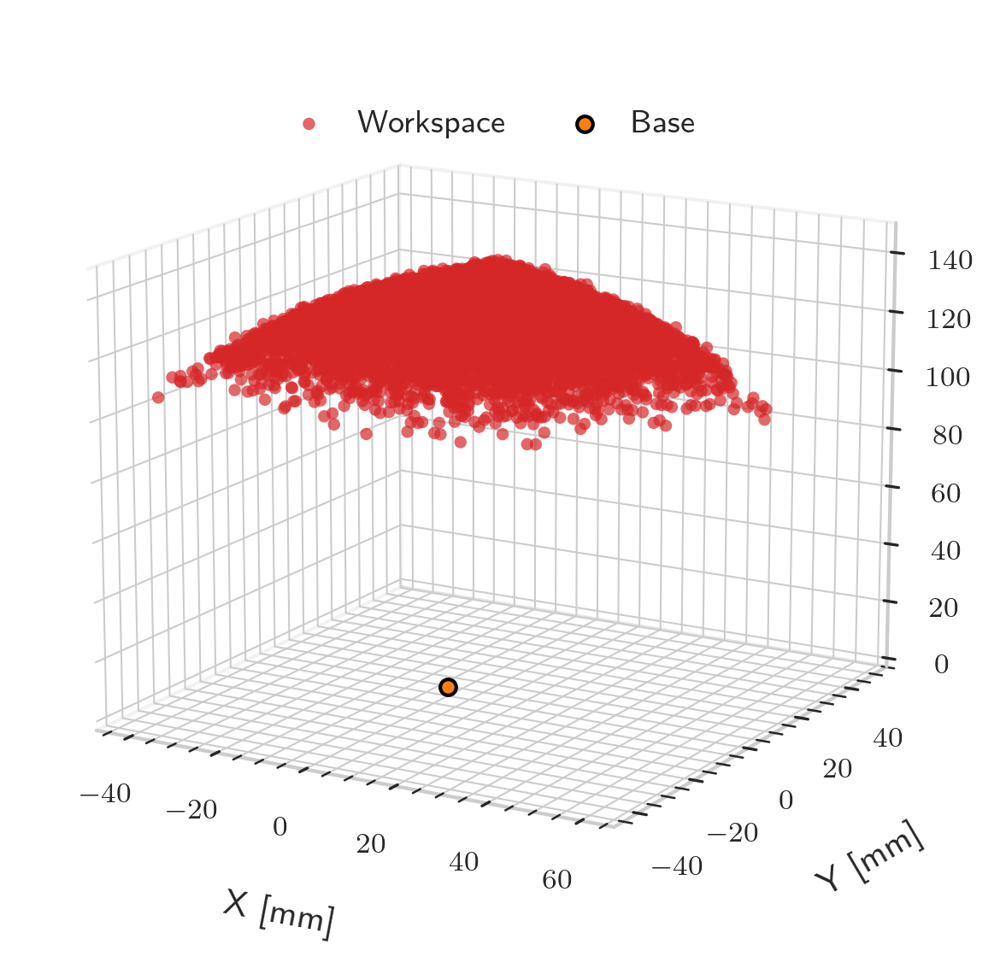

Workspace contains 10000 points
X range: [-47.9, 67.0] mm
Y range: [-48.1, 55.3] mm
Z range: [-3.0, 150.0] mm


In [5]:
# Load the workspace data
data = np.load("Workspace.npz")
xyz = data["xyz"]  # Single section workspace points

# Create publication-ready 3D plot
fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(111, projection='3d')

# Enhanced color scheme for publication
colors = {'workspace': '#d62728', 'base': '#ff7f0e'}

# Plot the workspace pointcloud with refined styling
ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], 
          c=colors['workspace'], s=12, alpha=0.7, 
          edgecolors='none', label='Workspace')

# Plot base point at origin with enhanced styling
ax.scatter([0], [0], [0], 
          c=colors['base'], s=20, marker='o', 
          edgecolors='black', linewidth=1, label='Base', zorder=10)

# Professional axis labels with units
ax.set_xlabel('X [mm]', labelpad=8)
ax.set_ylabel('Y [mm]', labelpad=8)
ax.set_zlabel('Z [mm]', labelpad=8)

# Create custom legend with horizontal layout above plot
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.5, 0.94), 
                  ncol=2, frameon=False, 
                  columnspacing=1.5, handletextpad=0.5)

# Optimal viewing angle for workspace visualization
ax.view_init(elev=15, azim=-60)

# Enhanced axis appearance
ax.tick_params(axis='both', which='major', labelsize=8, pad=2)
ax.tick_params(axis='both', which='minor', labelsize=7)

# Grid styling for better depth perception
ax.grid(True, alpha=0.3, linewidth=0.5)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('gray')
ax.yaxis.pane.set_edgecolor('gray')
ax.zaxis.pane.set_edgecolor('gray')
ax.xaxis.pane.set_alpha(0.1)
ax.yaxis.pane.set_alpha(0.1)
ax.zaxis.pane.set_alpha(0.1)

# Calculate optimal axis limits with proper margins
margin = 3  # mm
min_x = xyz[:, 0].min() - margin
max_x = xyz[:, 0].max() + margin
min_y = xyz[:, 1].min() - margin
max_y = xyz[:, 1].max() + margin
min_z = -margin
max_z = 150  # Fixed Z maximum

# Set equal aspect ratio and limits
ax.set_box_aspect([1, 1, 0.8])  # Slightly compressed Z for better view
ax.set_xlim([min_x, max_x])
ax.set_ylim([min_y, max_y])
ax.set_zlim([min_z, max_z])

# Remove excessive whitespace
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.show()

print(f"Workspace contains {xyz.shape[0]} points")
print(f"X range: [{min_x:.1f}, {max_x:.1f}] mm")
print(f"Y range: [{min_y:.1f}, {max_y:.1f}] mm") 
print(f"Z range: [{min_z:.1f}, {max_z:.1f}] mm")

## ⏳ Dataset generation

In [6]:
class ImageRegressionDataset(Dataset):
    def __init__(self, image_paths, label_paths, split="train"):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.augment = split == "train"

    def __len__(self):
        return len(self.image_paths)

    def apply_blur(self, image, kernel_size=5, sigma_max=8.0):
        sigma = random.uniform(0.0, sigma_max)
        image = image.float().unsqueeze(0) / 255.0
        image = TF.gaussian_blur(image, kernel_size=kernel_size, sigma=sigma)
        return (image.squeeze(0) * 255.0).clamp(0, 255).to(torch.uint8)

    def add_gaussian_noise(self, image, std_max=30.0):
        std = random.uniform(0.0, std_max)
        noise = torch.randn_like(image.float()) * std
        image = image.float() + noise
        return image.clamp(0, 255).to(torch.uint8)

    def apply_color_jitter(self, image, brightness=0.4, contrast=0.4):
        image = image.float().unsqueeze(0) / 255.0
        b = 1.0 + random.uniform(-brightness, brightness)
        c = 1.0 + random.uniform(-contrast, contrast)
        image = TF.adjust_brightness(image, b)
        image = TF.adjust_contrast(image, c)
        return (image.squeeze(0) * 255.0).clamp(0, 255).to(torch.uint8)

    def apply_brightness_shift(self, image, offset_max=0.3):
        offset = random.choice([-offset_max, offset_max])
        image = (image.float() / 255.0 + offset).clamp(0.0, 1.0)
        return (image * 255.0).to(torch.uint8)

    def apply_vignette(self, image, strength_max=0.6):
        strength = strength_max
        H, W = image.shape[1:]
        Y, X = torch.meshgrid(torch.linspace(-1, 1, H), torch.linspace(-1, 1, W), indexing='ij')
        radius = torch.sqrt(X**2 + Y**2)
        mask = 1.0 - strength * radius**2
        mask = mask.clamp(0.75, 1.0).unsqueeze(0)
        image = (image.float() / 255.0 * mask).clamp(0.0, 1.0)
        return (image * 255.0).to(torch.uint8)
    
    def apply_cutout(self, image, num_patches_range=(1, 3), max_ratio=0.5):
        C, H, W = image.shape
        num_patches = random.randint(*num_patches_range)
        for _ in range(num_patches):
            patch_h = int(random.uniform(0.0, max_ratio) * H)
            patch_w = int(random.uniform(0.0, max_ratio) * W)
            if patch_h == 0 or patch_w == 0:
                continue
            top = random.randint(0, H - patch_h)
            left = random.randint(0, W - patch_w)
            image[:, top:top + patch_h, left:left + patch_w] = 0  # black patch
        return image

    def __getitem__(self, idx):
        image = torch.load(self.image_paths[idx]).to(torch.uint8)
        label = torch.load(self.label_paths[idx]).float()

        if self.augment:
            image = self.apply_blur(image)
            image = self.add_gaussian_noise(image)
            image = self.apply_color_jitter(image)
            image = self.apply_brightness_shift(image)
            image = self.apply_vignette(image)
            image = self.apply_cutout(image)

        label = label.view(-1)

        return image, label
    
# Generic path loader for images + target (y or backbones)
def get_paths(split, target_folder):
    image_dir = os.path.join("images", split)
    target_dir = os.path.join(target_folder, split)
    image_paths = sorted([
        os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(".pt")
    ])
    target_paths = sorted([
        os.path.join(target_dir, f) for f in os.listdir(target_dir) if f.endswith(".pt")
    ])
    assert len(image_paths) == len(target_paths), f"Mismatch in {split} set"
    return image_paths, target_paths

In [7]:
class DELTALRegressionDataset(Dataset):
    def __init__(self, input_paths, label_paths):
        self.input_paths = input_paths
        self.label_paths = label_paths

    def __len__(self):
        return len(self.input_paths)

    def __getitem__(self, idx):
        input_tensor = torch.load(self.input_paths[idx]).float()
        label_tensor = torch.load(self.label_paths[idx]).float()
        return input_tensor, label_tensor

# Generic path loader for inverse kinematics (IK) inputs and labels
def get_paths_IK(split):
    input_dir = os.path.join("inputs", split)
    label_dir = os.path.join("labels", split)
    input_paths = sorted([os.path.join(input_dir, f) for f in os.listdir(input_dir) if f.endswith(".pt")])
    label_paths = sorted([os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith(".pt")])
    assert len(input_paths) == len(label_paths)
    return input_paths, label_paths

In [8]:
class CurvatureRegressionDataset(Dataset):
    def __init__(self, input_paths, label_paths):
        self.input_paths = input_paths
        self.label_paths = label_paths

    def __len__(self):
        return len(self.input_paths)

    def __getitem__(self, idx):
        input_tensor = torch.load(self.input_paths[idx]).float()
        label_tensor = torch.load(self.label_paths[idx]).float()
        return input_tensor, label_tensor

def get_paths_curvature(split, mode='quadratic'):
    input_dir_p = os.path.join("y", split)
    if mode == 'affine':
        label_dir = os.path.join("affine", split)
    elif mode == 'constant':
        label_dir = os.path.join("const", split)
    else:
        label_dir = os.path.join("quad", split)
    input_paths = sorted([os.path.join(input_dir_p, f) for f in os.listdir(input_dir_p) if f.endswith(".pt")])
    label_paths = sorted([os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith(".pt")])
    return input_paths, label_paths


In [9]:
# === First stage: training on y ===
train_img_y, train_lbl_y = get_paths("train", "y")
val_img_y, val_lbl_y = get_paths("val", "y")
test_img_y, test_lbl_y = get_paths("test", "y")

train_dataset_y = ImageRegressionDataset(train_img_y, train_lbl_y, split="train")
val_dataset_y = ImageRegressionDataset(val_img_y, val_lbl_y, split="val")
test_dataset_y = ImageRegressionDataset(test_img_y, test_lbl_y, split="test")

# Shared sampler
shared_sampler = RandomSampler(train_dataset_y)

train_loader_y = DataLoader(train_dataset_y, batch_size=16, sampler=shared_sampler,
                            num_workers=12, pin_memory=True, persistent_workers=True)
val_loader_y = DataLoader(val_dataset_y, batch_size=16, shuffle=False,
                          num_workers=12, pin_memory=True, persistent_workers=True)
test_loader_y = DataLoader(test_dataset_y, batch_size=16, shuffle=False,
                           num_workers=12, pin_memory=True, persistent_workers=True)

# === Second stage: training on shape descriptors ===
target_folders = ["quad", "affine", "const", "poly"]
loaders = {}

# To use it, e.g. loaders["quad"]["train"], for all target folders
for target in target_folders:
    train_img, train_lbl = get_paths("train", target)
    val_img, val_lbl = get_paths("val", target)
    test_img, test_lbl = get_paths("test", target)

    train_ds = ImageRegressionDataset(train_img, train_lbl, split="train")
    val_ds = ImageRegressionDataset(val_img, val_lbl, split="val")
    test_ds = ImageRegressionDataset(test_img, test_lbl, split="test")

    train_loader = DataLoader(train_ds, batch_size=16, sampler=shared_sampler,
                              num_workers=12, pin_memory=True, persistent_workers=True)
    val_loader = DataLoader(val_ds, batch_size=16, shuffle=False,
                            num_workers=12, pin_memory=True, persistent_workers=True)
    test_loader = DataLoader(test_ds, batch_size=16, shuffle=False,
                             num_workers=12, pin_memory=True, persistent_workers=True)

    loaders[target] = {
        "train": train_loader,
        "val": val_loader,
        "test": test_loader
    }

# === Third stage: inverse kinematics ===
train_inputs, train_labels = get_paths_IK("train")
val_inputs, val_labels = get_paths_IK("val")
test_inputs, test_labels = get_paths_IK("test")

train_dataset = DELTALRegressionDataset(train_inputs, train_labels)
val_dataset = DELTALRegressionDataset(val_inputs, val_labels)
test_dataset = DELTALRegressionDataset(test_inputs, test_labels)

train_loader_IK = DataLoader(train_dataset, batch_size=64, shuffle=True,
                          num_workers=12, pin_memory=True, persistent_workers=True)
val_loader_IK = DataLoader(val_dataset, batch_size=64, shuffle=False,
                        num_workers=12, pin_memory=True, persistent_workers=True)
test_loader_IK = DataLoader(test_dataset, batch_size=64, shuffle=False,
                         num_workers=12, pin_memory=True, persistent_workers=True)

# === Fourth stage: curvature regression ===
train_inputs_quad, train_labels_quad = get_paths_curvature("train", mode='quadratic')
val_inputs_quad, val_labels_quad = get_paths_curvature("val", mode='quadratic')
test_inputs_quad, test_labels_quad = get_paths_curvature("test", mode='quadratic')

train_inputs_affine, train_labels_affine = get_paths_curvature("train", mode='affine')
val_inputs_affine, val_labels_affine = get_paths_curvature("val", mode='affine')
test_inputs_affine, test_labels_affine = get_paths_curvature("test", mode='affine')

train_inputs_const, train_labels_const = get_paths_curvature("train", mode='constant')
val_inputs_const, val_labels_const = get_paths_curvature("val", mode='constant')
test_inputs_const, test_labels_const = get_paths_curvature("test", mode='constant')

train_dataset_quad = CurvatureRegressionDataset(train_inputs_quad, train_labels_quad)
val_dataset_quad = CurvatureRegressionDataset(val_inputs_quad, val_labels_quad)
test_dataset_quad = CurvatureRegressionDataset(test_inputs_quad, test_labels_quad)

train_dataset_affine = CurvatureRegressionDataset(train_inputs_affine, train_labels_affine)
val_dataset_affine = CurvatureRegressionDataset(val_inputs_affine, val_labels_affine)
test_dataset_affine = CurvatureRegressionDataset(test_inputs_affine, test_labels_affine)

train_dataset_const = CurvatureRegressionDataset(train_inputs_const, train_labels_const)
val_dataset_const = CurvatureRegressionDataset(val_inputs_const, val_labels_const)
test_dataset_const = CurvatureRegressionDataset(test_inputs_const, test_labels_const)

train_loader_quad = DataLoader(train_dataset_quad, batch_size=64, shuffle=True,
                               num_workers=12, pin_memory=True, persistent_workers=True)
val_loader_quad = DataLoader(val_dataset_quad, batch_size=64, shuffle=False,
                             num_workers=12, pin_memory=True, persistent_workers=True)
test_loader_quad = DataLoader(test_dataset_quad, batch_size=64, shuffle=False,
                              num_workers=12, pin_memory=True, persistent_workers=True)

train_loader_affine = DataLoader(train_dataset_affine, batch_size=64, shuffle=True,
                                 num_workers=12, pin_memory=True, persistent_workers=True)
val_loader_affine = DataLoader(val_dataset_affine, batch_size=64, shuffle=False,
                               num_workers=12, pin_memory=True, persistent_workers=True)
test_loader_affine = DataLoader(test_dataset_affine, batch_size=64, shuffle=False,
                                num_workers=12, pin_memory=True, persistent_workers=True)

train_loader_const = DataLoader(train_dataset_const, batch_size=64, shuffle=True,
                                num_workers=12, pin_memory=True, persistent_workers=True)
val_loader_const = DataLoader(val_dataset_const, batch_size=64, shuffle=False,
                              num_workers=12, pin_memory=True, persistent_workers=True)
test_loader_const = DataLoader(test_dataset_const, batch_size=64, shuffle=False,
                               num_workers=12, pin_memory=True, persistent_workers=True)

In [10]:
# Model for grayscale images CNN regression
class NetCameraBW(nn.Module):
    def __init__(self):
        super().__init__()

        # Load MobileNetV2 backbone
        mobilenet = models.mobilenet_v2(pretrained=True)

        # Adapt first conv layer to 1 input channel
        first_conv = mobilenet.features[0][0]
        mobilenet.features[0][0] = nn.Conv2d(
            in_channels=1,
            out_channels=first_conv.out_channels,
            kernel_size=first_conv.kernel_size,
            stride=first_conv.stride,
            padding=first_conv.padding,
            bias=False
        )

        self.backbone = mobilenet.features  # Only feature extractor

        self.pool = nn.AdaptiveAvgPool2d(1)  # Final pooling to [B, C, 1, 1]

        # Head for 6 regression outputs
        self.head = nn.Sequential(
            nn.Flatten(),              # [B, C]
            nn.Linear(1280, 6)         # MobileNetV2 output channels = 1280
        )

    def forward(self, x):
        x = x / 255.0  # Normalize input from [0,255] to [0,1]

        x = self.backbone(x)
        x = self.pool(x)

        return self.head(x)

## ⏰ Testing pose reconstructor

In [11]:
# Redefine the model for denormalization
class DenormalizedModel(nn.Module):
    def __init__(self, base_model, mean, std):
        super().__init__()
        self.base_model = base_model
        self.register_buffer("mean", mean)
        self.register_buffer("std", std)

    def forward(self, x):
        out = self.base_model(x)
        return out * self.std + self.mean

In [12]:
def AngularDistance(pred_euler, target_euler):
        """
        Computes angular distance given predicted and target euler angles ('zyx').
        This is done according to the rotation along the principal axis.
        """

        r_pred = R.from_euler('zyx', pred_euler) 
        r_target = R.from_euler('zyx', target_euler)
        r_error = r_target * r_pred.inv()
        axis_angle = r_error.as_rotvec()
        return np.linalg.norm(axis_angle)

In [13]:
# Load only the TorchScript model
model = torch.jit.load("models/vision/helyx_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
   for images, labels in test_loader_y:
       images = images.to(device)
       labels = labels.to(device)

       preds = model(images)
       all_preds.append(preds.cpu().numpy())
       all_labels.append(labels.cpu().numpy())

       del images, labels, preds

print("\n")

# Stack all predictions and labels
all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Convert angular part to degrees
all_preds[:, 3:] = np.rad2deg(all_preds[:, 3:])
all_labels[:, 3:] = np.rad2deg(all_labels[:, 3:])

# Calculate statistics
param_names = ['X [mm]', 'Y [mm]', 'Z [mm]', 'Yaw [°]', 'Pitch [°]', 'Roll [°]']

mae_values = []
std_values = []

for i in range(len(param_names)):
   errors = np.abs(all_preds[:, i] - all_labels[:, i])
   mae = np.mean(errors)
   std = np.std(errors)
   mae_values.append(mae)
   std_values.append(std)

# Create statistics table
import pandas as pd

stats_data = {
   'Parameter': param_names,
   'MAE': [f"{mae:.2f}" for mae in mae_values],
   'Std': [f"{std:.2f}" for std in std_values]
}

stats_df = pd.DataFrame(stats_data)
print("\n--- Parameter-wise Error Statistics ---")
print(stats_df.to_string(index=False))

# --- Pose-specific error metrics ---

# Euclidean error on position (X, Y, Z) in mm
pos_error = np.linalg.norm(all_preds[:, :3] - all_labels[:, :3], axis=1)
mean_pos_error = np.mean(pos_error)
std_pos_error = np.std(pos_error)

# Angular distance error on orientation (Yaw, Pitch, Roll) in radians
rot_error = np.array([AngularDistance(np.deg2rad(all_preds[i, 3:]), np.deg2rad(all_labels[i, 3:])) 
                    for i in range(len(all_preds))])
mean_rot_error = np.mean(rot_error) * 180/np.pi  # Convert to degrees for display
std_rot_error = np.std(rot_error) * 180/np.pi    # Convert to degrees for display

# Pose-level statistics table
pose_stats_data = {
   'Error Type': ['Position [mm]', 'Rotation [°]'],
   'MAE': [f"{mean_pos_error:.2f}", f"{mean_rot_error:.2f}"],
   'Std': [f"{std_pos_error:.2f}", f"{std_rot_error:.2f}"]
}

pose_stats_df = pd.DataFrame(pose_stats_data)
print("\n--- Pose-Level Error Summary ---")
print(pose_stats_df.to_string(index=False))




--- Parameter-wise Error Statistics ---
Parameter  MAE  Std
   X [mm] 2.28 1.94
   Y [mm] 2.33 2.02
   Z [mm] 1.22 0.95
  Yaw [°] 0.42 0.35
Pitch [°] 1.98 1.67
 Roll [°] 2.00 1.71

--- Pose-Level Error Summary ---
   Error Type  MAE  Std
Position [mm] 3.99 2.23
 Rotation [°] 3.11 1.96


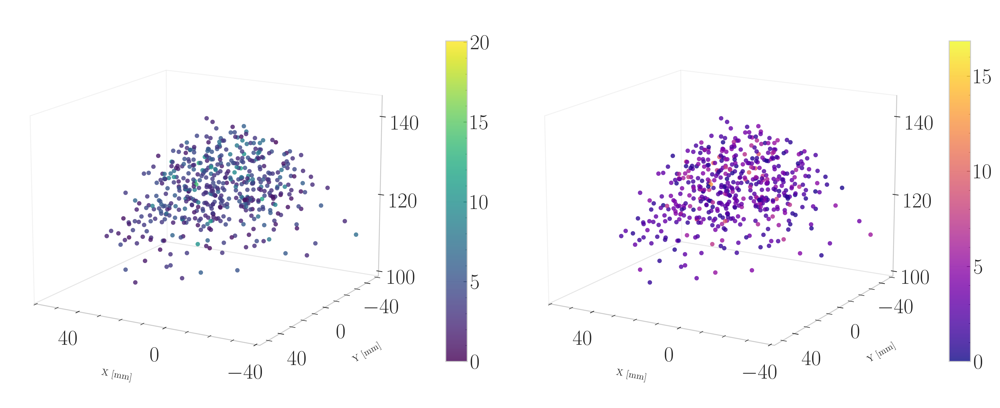

In [14]:
# --- Load the trained TorchScript model ---
model = torch.jit.load("models/vision/helyx_model.pt", map_location=device)
model.eval()

# --- Inference on training data (train + val) ---
train_preds, train_labels = [], []

with torch.no_grad():
  for images, labels in train_loader_y:
      images = images.to(device)
      labels = labels.to(device)
      preds = model(images)
      train_preds.append(preds.cpu().numpy())
      train_labels.append(labels.cpu().numpy())
      del images, labels, preds

with torch.no_grad():
  for images, labels in val_loader_y:
      images = images.to(device)
      labels = labels.to(device)
      preds = model(images)
      train_preds.append(preds.cpu().numpy())
      train_labels.append(labels.cpu().numpy())
      del images, labels, preds

train_preds = np.concatenate(train_preds, axis=0)
train_labels = np.concatenate(train_labels, axis=0)
train_preds[:, 3:] = np.rad2deg(train_preds[:, 3:])
train_labels[:, 3:] = np.rad2deg(train_labels[:, 3:])

# --- Inference on test data ---
test_preds, test_labels = [], []

with torch.no_grad():
  for images, labels in test_loader_y:
      images = images.to(device)
      labels = labels.to(device)
      preds = model(images)
      test_preds.append(preds.cpu().numpy())
      test_labels.append(labels.cpu().numpy())
      del images, labels, preds

test_preds = np.concatenate(test_preds, axis=0)
test_labels = np.concatenate(test_labels, axis=0)
test_preds[:, 3:] = np.rad2deg(test_preds[:, 3:])
test_labels[:, 3:] = np.rad2deg(test_labels[:, 3:])

# --- Compute position and orientation errors ---
train_pos_error = np.linalg.norm(train_preds[:, :3] - train_labels[:, :3], axis=1)
train_rot_error = np.array([AngularDistance(np.deg2rad(train_preds[i, 3:]), np.deg2rad(train_labels[i, 3:])) 
                         for i in range(len(train_preds))]) * 180/np.pi
test_pos_error = np.linalg.norm(test_preds[:, :3] - test_labels[:, :3], axis=1)
test_rot_error = np.array([AngularDistance(np.deg2rad(test_preds[i, 3:]), np.deg2rad(test_labels[i, 3:])) 
                        for i in range(len(test_preds))]) * 180/np.pi

# --- Shared color limits for consistency ---
max_pos = max(train_pos_error.max(), test_pos_error.max())
max_rot = max(train_rot_error.max(), test_rot_error.max())

# --- Configure matplotlib for publication quality ---
plt.rcParams.update({
  'font.size': 28,
  'font.family': 'serif',
  'axes.linewidth': 1.0,
  'xtick.major.size': 4,
  'xtick.minor.size': 2,
  'ytick.major.size': 4,
  'ytick.minor.size': 2,
  'xtick.direction': 'in',
  'ytick.direction': 'in'
})

# --- Create combined plot ---
fig = plt.figure(figsize=(16, 8))

# Position error plot
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
sc1 = ax1.scatter(test_labels[:, 0], test_labels[:, 1], test_labels[:, 2],
                 c=test_pos_error, cmap='viridis', vmin=0, vmax=max_pos, s=23, alpha=0.8, edgecolors='none')
ax1.set_xlabel('X [mm]', labelpad=22, horizontalalignment='center')
ax1.set_ylabel('Y [mm]', labelpad=22, horizontalalignment='center')
ax1.view_init(elev=15, azim=120)
ax1.tick_params(axis='x', labelsize=23, pad=8)
ax1.tick_params(axis='y', labelsize=23, pad=8)
ax1.tick_params(axis='z', labelsize=23, pad=8)

# Orientation error plot
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
sc2 = ax2.scatter(test_labels[:, 0], test_labels[:, 1], test_labels[:, 2],
                 c=test_rot_error, cmap='plasma', vmin=0, vmax=max_rot, s=23, alpha=0.8, edgecolors='none')
ax2.set_xlabel('X [mm]', labelpad=22, horizontalalignment='center')
ax2.set_ylabel('Y [mm]', labelpad=22, horizontalalignment='center')
ax2.view_init(elev=15, azim=120)
ax2.tick_params(axis='x', labelsize=23, pad=8)
ax2.tick_params(axis='y', labelsize=23, pad=8)
ax2.tick_params(axis='z', labelsize=23, pad=8)

# Custom axis ticks
for ax in [ax1, ax2]:
  xlim = ax.get_xlim()
  ylim = ax.get_ylim()
  zlim = ax.get_zlim()
  
  x_ticks = np.arange(np.ceil(xlim[0]/40)*40, np.floor(xlim[1]/40)*40 + 40, 40)
  y_ticks = np.arange(np.ceil(ylim[0]/40)*40, np.floor(ylim[1]/40)*40 + 40, 40)
  z_ticks = np.arange(np.ceil(zlim[0]/20)*20, np.floor(zlim[1]/20)*20 + 20, 20)
  
  ax.set_xticks(x_ticks)
  ax.set_yticks(y_ticks)
  ax.set_zticks(z_ticks)
  
  ax.set_zlabel('')
  ax.xaxis.pane.fill = False
  ax.yaxis.pane.fill = False
  ax.zaxis.pane.fill = False
  ax.xaxis.pane.set_edgecolor('gray')
  ax.yaxis.pane.set_edgecolor('gray')
  ax.zaxis.pane.set_edgecolor('gray')
  ax.xaxis.pane.set_alpha(0.1)
  ax.yaxis.pane.set_alpha(0.1)
  ax.zaxis.pane.set_alpha(0.1)
  ax.grid(False)

# Colorbars
cbar_ax1 = fig.add_axes([0.46, 0.2, 0.02, 0.6])
cbar1 = fig.colorbar(sc1, cax=cbar_ax1)
cbar1.ax.tick_params(labelsize=23)

cbar_ax2 = fig.add_axes([0.93, 0.2, 0.02, 0.6])
cbar2 = fig.colorbar(sc2, cax=cbar_ax2)
cbar2.ax.tick_params(labelsize=23)

# Set orientation colorbar ticks every 5 with no comma formatting
import matplotlib.ticker as ticker
cbar2.locator = ticker.MultipleLocator(5)
cbar2.formatter = ticker.FuncFormatter(lambda x, pos: f'{int(x)}')
cbar2.update_ticks()

plt.subplots_adjust(left=0.05, right=0.9, wspace=0.3)
plt.show()

# Reset matplotlib parameters
plt.rcdefaults()

## ⏰ Testing curvature approximations

Quadratic curvature model

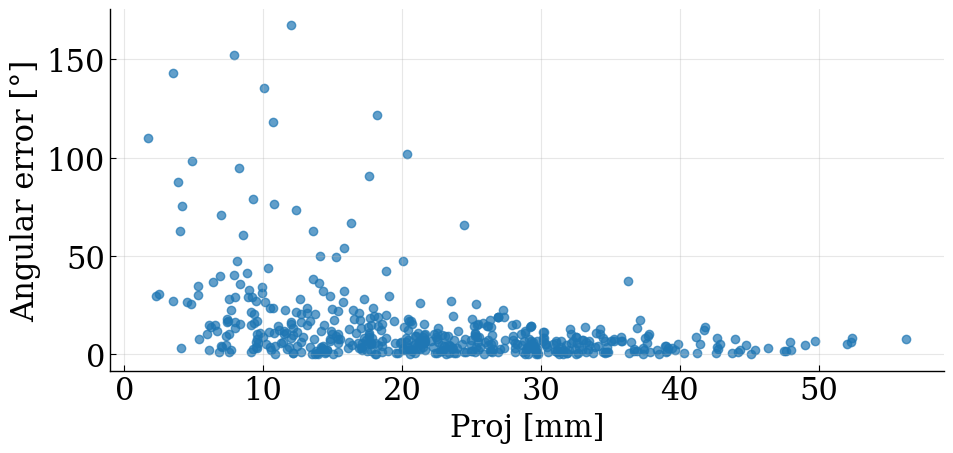

QUADRATIC MODEL EVALUATION RESULTS

--- Parameter-wise Error Statistics ---
Parameter      MAE      Std
   S [mm]     0.94     0.85
    $c_0$ 3.81e-04 4.18e-04
    $c_1$ 1.47e-05 1.75e-05
    $c_2$ 1.15e-07 1.39e-07

--- Angular Error Statistics ---
         Error Type   MAE   Std
Angular Error φ [°] 13.27 21.14


In [15]:
# Load the model (predicts: L, c0, c1, c2, φ)
model = torch.jit.load("models/curvature/quadratic_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

# Inference loop
with torch.no_grad():
    for images, labels in loaders["quad"]["test"]:
        images = images.to(device)
        labels = labels.to(device)

        preds = model(images)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())

        del images, labels, preds

# Stack predictions and ground truth
all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Extract φ and convert to degrees
phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

# Extract parameters S, c0, c1, c2
S, c0, c1, c2 = all_preds[:, 0], all_preds[:, 1], all_preds[:, 2], all_preds[:, 3]
S_true, c0_true, c1_true, c2_true = all_labels[:, 0], all_labels[:, 1], all_labels[:, 2], all_labels[:, 3]

# True pi computation
n_points = 100
v = np.linspace(0, 1, n_points)

s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None]*s_true + 0.5*c1_true[:, None]*s_true**2 + (1/3)*c2_true[:, None]*s_true**3
sin_theta_true = np.sin(theta_true)
pi_true = np.trapz(sin_theta_true, s_true, axis=1)

# Parameter names
param_names = ['S [mm]', r'$c_0$', r'$c_1$', r'$c_2$']

# Calculate statistics
mae_values = []
std_values = []

for i in range(4):
    errors = np.abs(all_preds[:, i] - all_labels[:, i])
    mae = np.mean(errors)
    std = np.std(errors)
    mae_values.append(mae)
    std_values.append(std)

# Configure matplotlib for publication quality
plt.rcParams.update({
  'font.size': 22,
  'font.family': 'serif',
  'axes.linewidth': 1.0,
  'xtick.major.size': 4,
  'xtick.minor.size': 2,
  'ytick.major.size': 4,
  'ytick.minor.size': 2,
  'xtick.direction': 'in',
  'ytick.direction': 'in'
})

# Angle error plot
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

# Angle difference wrapped to [0°, 180°]
delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)
mae_phi = np.mean(delta_phi)
std_phi = np.std(delta_phi)

ax.scatter(pi_true, delta_phi, alpha=0.7)
ax.set_xlabel('Proj [mm]')
ax.set_ylabel('Angular error [°]')
ax.tick_params(which='both', direction='in')
ax.grid(True, alpha=0.3)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# Reset matplotlib parameters
plt.rcdefaults()

# Create statistics table
import pandas as pd

param_stats_data = {
    'Parameter': param_names,
    'MAE': [f"{mae:.2e}" if i in [1,2,3] else f"{mae:.2f}" for i, mae in enumerate(mae_values)],
    'Std': [f"{std:.2e}" if i in [1,2,3] else f"{std:.2f}" for i, std in enumerate(std_values)]
}

param_stats_df = pd.DataFrame(param_stats_data)

angle_stats_data = {
    'Error Type': [r'Angular Error φ [°]'],
    'MAE': [f"{mae_phi:.2f}"],
    'Std': [f"{std_phi:.2f}"]
}

angle_stats_df = pd.DataFrame(angle_stats_data)

print("=" * 50)
print("QUADRATIC MODEL EVALUATION RESULTS")
print("=" * 50)

print("\n--- Parameter-wise Error Statistics ---")
print(param_stats_df.to_string(index=False))

print("\n--- Angular Error Statistics ---")
print(angle_stats_df.to_string(index=False))

Affine curvature model

In [16]:
# Load the model (predicts: L, c0, c1, φ)
model = torch.jit.load("models/curvature/affine_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

# Inference loop
with torch.no_grad():
   for images, labels in loaders["affine"]["test"]:
       images = images.to(device)
       labels = labels.to(device)

       preds = model(images)
       all_preds.append(preds.cpu().numpy())
       all_labels.append(labels.cpu().numpy())

# Stack predictions and ground truth
all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Extract φ and convert to degrees
phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

# Extract parameters
S = all_preds[:, 0]
c0 = all_preds[:, 1]
c1 = all_preds[:, 2]
S_true = all_labels[:, 0]
c0_true = all_labels[:, 1]
c1_true = all_labels[:, 2]

# Compute π
n_points = 100
v = np.linspace(0, 1, n_points)

s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None] * s_true + 0.5 * c1_true[:, None] * s_true**2
pi_true = np.trapz(np.sin(theta_true), s_true, axis=1)

# Parameter names
param_names = ['S [mm]', r'$c_0$', r'$c_1$']

# Calculate statistics
mae_values = []
std_values = []

for i in range(3):
   errors = np.abs(all_preds[:, i] - all_labels[:, i])
   mae = np.mean(errors)
   std = np.std(errors)
   mae_values.append(mae)
   std_values.append(std)

# Angle difference wrapped to [0°, 180°]
delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)
mae_phi = np.mean(delta_phi)
std_phi = np.std(delta_phi)

# Create statistics table
import pandas as pd

param_stats_data = {
   'Parameter': param_names,
   'MAE': [f"{mae:.2e}" if i in [1,2] else f"{mae:.2f}" for i, mae in enumerate(mae_values)],
   'Std': [f"{std:.2e}" if i in [1,2] else f"{std:.2f}" for i, std in enumerate(std_values)]
}

param_stats_df = pd.DataFrame(param_stats_data)

angle_stats_data = {
   'Error Type': [r'Angular Error φ [°]'],
   'MAE': [f"{mae_phi:.2f}"],
   'Std': [f"{std_phi:.2f}"]
}

angle_stats_df = pd.DataFrame(angle_stats_data)

print("=" * 50)
print("AFFINE MODEL EVALUATION RESULTS")
print("=" * 50)

print("\n--- Parameter-wise Error Statistics ---")
print(param_stats_df.to_string(index=False))

print("\n--- Angular Error Statistics ---")
print(angle_stats_df.to_string(index=False))

AFFINE MODEL EVALUATION RESULTS

--- Parameter-wise Error Statistics ---
Parameter      MAE      Std
   S [mm]     0.95     0.86
    $c_0$ 3.26e-04 2.67e-04
    $c_1$ 2.27e-06 2.53e-06

--- Angular Error Statistics ---
         Error Type   MAE   Std
Angular Error φ [°] 13.94 24.04


Constant curvature model

In [17]:
# Load TorchScript model
model = torch.jit.load("models/curvature/const_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

# Inference loop
with torch.no_grad():
   for images, labels in loaders["const"]["test"]:
       images = images.to(device)
       labels = labels.to(device)

       preds = model(images)
       all_preds.append(preds.cpu().numpy())
       all_labels.append(labels.cpu().numpy())

# Stack predictions and ground truth
all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Extract φ and convert to degrees
phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

# Extract parameters
S = all_preds[:, 0]
c0 = all_preds[:, 1]
S_true = all_labels[:, 0]
c0_true = all_labels[:, 1]

# Compute π
n_points = 100
v = np.linspace(0, 1, n_points)
s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None] * s_true
pi_true = np.trapz(np.sin(theta_true), s_true, axis=1)

# Parameter names
param_names = ['S [mm]', r'$c_0$']

# Calculate statistics
mae_values = []
std_values = []

for i in range(2):
   errors = np.abs(all_preds[:, i] - all_labels[:, i])
   mae = np.mean(errors)
   std = np.std(errors)
   mae_values.append(mae)
   std_values.append(std)

# Angle difference wrapped to [0°, 180°]
delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)
mae_phi = np.mean(delta_phi)
std_phi = np.std(delta_phi)

# Create statistics table
import pandas as pd

param_stats_data = {
   'Parameter': param_names,
   'MAE': [f"{mae:.2f}" if i == 0 else f"{mae:.2e}" for i, mae in enumerate(mae_values)],
   'Std': [f"{std:.2f}" if i == 0 else f"{std:.2e}" for i, std in enumerate(std_values)]
}

param_stats_df = pd.DataFrame(param_stats_data)

angle_stats_data = {
   'Error Type': [r'Angular Error φ [°]'],
   'MAE': [f"{mae_phi:.2f}"],
   'Std': [f"{std_phi:.2f}"]
}

angle_stats_df = pd.DataFrame(angle_stats_data)

print("=" * 50)
print("CONSTANT MODEL EVALUATION RESULTS")
print("=" * 50)

print("\n--- Parameter-wise Error Statistics ---")
print(param_stats_df.to_string(index=False))

print("\n--- Angular Error Statistics ---")
print(angle_stats_df.to_string(index=False))

CONSTANT MODEL EVALUATION RESULTS

--- Parameter-wise Error Statistics ---
Parameter      MAE      Std
   S [mm]     0.94     0.91
    $c_0$ 2.66e-04 2.12e-04

--- Angular Error Statistics ---
         Error Type   MAE   Std
Angular Error φ [°] 12.67 20.39


## ⏰ Plot body reconstructions

In [18]:
# Class for curvature and polynomial plotting
class PlotCurvature:
    """
    Defines plotting arrays:
    - curvature (c0, c1, c2)
    """

    def __init__(self):
        pass
    
    def curvature(self, S, c0, c1, c2):
        """
        Curvature approximation.
        Output:
        - s: positions along the central axis (curved) from 0 to S
        - y: array of displacements along the axis at positions s
        """
        v = np.linspace(0, S, 1000)
        integrand_s = np.cos(c0*v + 0.5*c1*v**2 + (1/3)*c2*v**3)
        s = cumulative_trapezoid(integrand_s, v, initial=0.0)
        integrand_y = np.sin(c0*v + 0.5*c1*v**2 + (1/3)*c2*v**3)
        y = cumulative_trapezoid(integrand_y, v, initial=0.0)

        return s, y

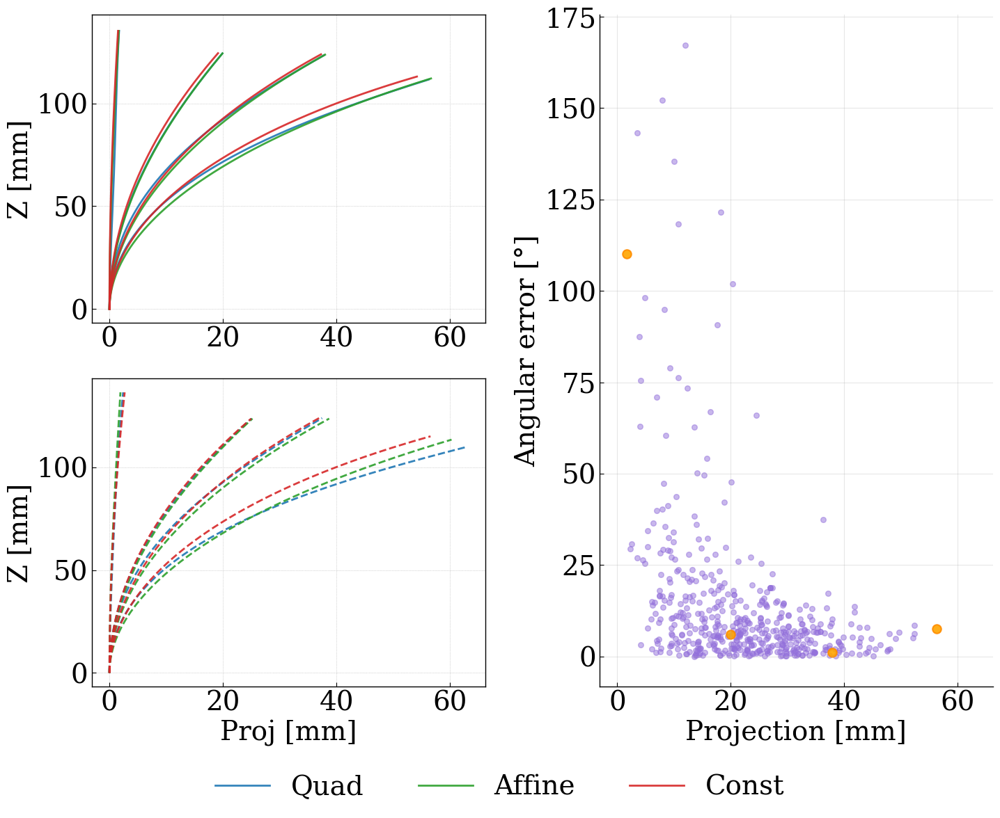

In [19]:
def create_cylinder_envelope_2d(ax, curves_list, radius=3.0, alpha=0.0, color='lightgrey'):
    const_curve = curves_list[2]  # const is third in list
    z_vals, x_vals = const_curve
    ax.plot(z_vals, x_vals, color=color, linewidth=radius*2, alpha=alpha, solid_capstyle='round')

# Plot settings
plotter = PlotCurvature()
ylim = (0, 145)
colors = {
    "quad": "tab:blue",
    "affine": "tab:green", 
    "const": "tab:red"
}

# Model loading
quad_model = torch.jit.load("models/curvature/quadratic_model.pt", map_location=device).eval()
affine_model = torch.jit.load("models/curvature/affine_model.pt", map_location=device).eval()
const_model = torch.jit.load("models/curvature/const_model.pt", map_location=device).eval()

# Load data
images_y, labels_quad, labels_affine, labels_const = [], [], [], []
for (
    (img_y, _),
    (_, lbl_quad),
    (_, lbl_affine),
    (_, lbl_const)
) in zip(
    test_loader_y,
    loaders["quad"]["test"],
    loaders["affine"]["test"],
    loaders["const"]["test"]
):
    images_y.append(img_y)
    labels_quad.append(lbl_quad)
    labels_affine.append(lbl_affine)
    labels_const.append(lbl_const)

images_y = torch.cat(images_y, dim=0)
labels_quad = torch.cat(labels_quad, dim=0)
labels_affine = torch.cat(labels_affine, dim=0)
labels_const = torch.cat(labels_const, dim=0)

# 1. Compute all pi projections
pi_values = []
for idx in range(len(images_y)):
    label_quad = labels_quad[idx].cpu().numpy()
    S_gt, c0, c1, c2, phi_curv = label_quad
    
    # Compute pi from ground truth quadratic parameters
    n_points = 100
    v = np.linspace(0, 1, n_points)
    s_true = S_gt * v
    theta_true = c0*s_true + 0.5*c1*s_true**2 + (1/3)*c2*s_true**3
    sin_theta_true = np.sin(theta_true)
    pi_true = np.trapz(sin_theta_true, s_true)
    
    pi_values.append((idx, pi_true))

# Sort by pi values
pi_values.sort(key=lambda x: x[1])
pi_min = pi_values[0][1]
pi_max = pi_values[-1][1]

# 2. Choose 4 values spread along the pi interval
N = 4
spread_indices = []
for i in range(N):
    # Find index corresponding to quantile position
    quantile_pos = i / (N - 1)  # 0, 1/3, 2/3, 1
    target_pi = pi_min + quantile_pos * (pi_max - pi_min)
    
    # Find closest pi value
    closest_idx = min(range(len(pi_values)), 
                     key=lambda x: abs(pi_values[x][1] - target_pi))
    spread_indices.append(pi_values[closest_idx][0])

# 3. Generate all curves for selected samples
all_curves_2d_gt = {"quad": [], "affine": [], "const": []}
all_curves_2d_pred = {"quad": [], "affine": [], "const": []}

for idx in spread_indices:
    image = images_y[idx].unsqueeze(0).to(device)

    label_quad = labels_quad[idx].cpu().numpy()
    label_affine = labels_affine[idx].cpu().numpy()
    label_const = labels_const[idx].cpu().numpy()

    S_gt, c0, c1, c2, phi_curv = label_quad
    _, ca0, ca1, _ = label_affine
    _, cc0, _ = label_const

    with torch.no_grad():
        pred_quad = quad_model(image)[0].cpu().numpy()
        pred_affine = affine_model(image)[0].cpu().numpy()
        pred_const = const_model(image)[0].cpu().numpy()

    S_p, c0_p, c1_p, c2_p, phi_curv_pred = pred_quad
    _, ca0_p, ca1_p, _ = pred_affine
    _, cc0_p, _ = pred_const

    # Generate 2D curves - Ground Truth
    x_quad_gt, z_quad_gt = plotter.curvature(S_gt, c0, c1, c2)
    x_aff_gt, z_aff_gt = plotter.curvature(S_gt, ca0, ca1, 0.0)
    x_const_gt, z_const_gt = plotter.curvature(S_gt, cc0, 0.0, 0.0)

    all_curves_2d_gt["quad"].append((z_quad_gt, x_quad_gt))
    all_curves_2d_gt["affine"].append((z_aff_gt, x_aff_gt))
    all_curves_2d_gt["const"].append((z_const_gt, x_const_gt))

    # Generate 2D curves - Predictions
    x_quad_pred, z_quad_pred = plotter.curvature(S_p, c0_p, c1_p, c2_p)
    x_aff_pred, z_aff_pred = plotter.curvature(S_p, ca0_p, ca1_p, 0.0)
    x_const_pred, z_const_pred = plotter.curvature(S_p, cc0_p, 0.0, 0.0)

    all_curves_2d_pred["quad"].append((z_quad_pred, x_quad_pred))
    all_curves_2d_pred["affine"].append((z_aff_pred, x_aff_pred))
    all_curves_2d_pred["const"].append((z_const_pred, x_const_pred))

# Compute common limits for 2D plots
all_x_vals = []
all_z_vals = []
for model in ["quad", "affine", "const"]:
    for z, x in all_curves_2d_gt[model]:
        all_x_vals.extend(x)
        all_z_vals.extend(z)
    for z, x in all_curves_2d_pred[model]:
        all_x_vals.extend(x)
        all_z_vals.extend(z)

x_min, x_max = min(all_x_vals), max(all_x_vals)
z_min, z_max = min(all_z_vals), max(all_z_vals)
x_padding = (x_max - x_min) * 0.05
z_padding = (z_max - z_min) * 0.05

x_lim = (x_min - x_padding, x_max + x_padding)
z_lim = (z_min - z_padding, z_max + z_padding)

# Configure matplotlib for publication quality
plt.rcParams.update({
  'font.size': 28,
  'font.family': 'serif',
  'axes.linewidth': 1.0,
  'xtick.major.size': 4,
  'xtick.minor.size': 2,
  'ytick.major.size': 4,
  'ytick.minor.size': 2,
  'xtick.direction': 'in',
  'ytick.direction': 'in'
})

# Create layout with 3 subplots: 2 stacked on left, 1 on right
fig = plt.figure(figsize=(15, 12))

# Create grid layout
ax1 = plt.subplot2grid((2, 2), (0, 0))  # Top left
ax2 = plt.subplot2grid((2, 2), (1, 0), sharex=ax1)  # Bottom left
ax3 = plt.subplot2grid((2, 2), (0, 1), rowspan=2)  # Right side (spans both rows)

# Plot Ground Truth (top left)
for i in range(len(spread_indices)):
    robot_curves = [
        all_curves_2d_gt["quad"][i],
        all_curves_2d_gt["affine"][i], 
        all_curves_2d_gt["const"][i]
    ]
    create_cylinder_envelope_2d(ax1, robot_curves, radius=8.0)

for model in ["quad", "affine", "const"]:
    for i, (z, x) in enumerate(all_curves_2d_gt[model]):
        label = f"{model.capitalize()}" if i == 0 else None
        ax1.plot(z, x, color=colors[model], linewidth=2, alpha=0.9, label=label)

ax1.set_xlim(z_lim)
ax1.set_ylim(x_lim)
ax1.grid(True, linestyle=':', linewidth=0.5)
ax1.set_ylabel("Z [mm]", fontsize=28)

# Plot CNN Predictions (bottom left)
for i in range(len(spread_indices)):
    robot_curves = [
        all_curves_2d_pred["quad"][i],
        all_curves_2d_pred["affine"][i],
        all_curves_2d_pred["const"][i]
    ]
    create_cylinder_envelope_2d(ax2, robot_curves, radius=8.0)

for model in ["quad", "affine", "const"]:
    for i, (z, x) in enumerate(all_curves_2d_pred[model]):
        ax2.plot(z, x, color=colors[model], linewidth=2, alpha=0.9, linestyle='--')

ax2.set_xlim(z_lim)
ax2.set_ylim(x_lim)
ax2.grid(True, linestyle=':', linewidth=0.5)
ax2.set_xlabel("Proj [mm]", fontsize=28)
ax2.set_ylabel("Z [mm]", fontsize=28)

# Add angular error plot on the right
# Load quadratic model and compute angular errors
model = torch.jit.load("models/curvature/quadratic_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in loaders["quad"]["test"]:
        images = images.to(device)
        labels = labels.to(device)
        preds = model(images)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())
        del images, labels, preds

all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Extract φ and convert to degrees
phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

# Extract parameters for pi computation
S_true, c0_true, c1_true, c2_true = all_labels[:, 0], all_labels[:, 1], all_labels[:, 2], all_labels[:, 3]

# True pi computation
n_points = 100
v = np.linspace(0, 1, n_points)
s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None]*s_true + 0.5*c1_true[:, None]*s_true**2 + (1/3)*c2_true[:, None]*s_true**3
sin_theta_true = np.sin(theta_true)
pi_true = np.trapz(sin_theta_true, s_true, axis=1)

# Angle difference wrapped to [0°, 180°]
delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)

# Create mask for highlighted points (the 4 chosen indices)
highlight_mask = np.zeros(len(pi_true), dtype=bool)
highlight_mask[spread_indices] = True

# Plot all points in violet
ax3.scatter(pi_true[~highlight_mask], delta_phi[~highlight_mask], 
           alpha=0.5, color='mediumpurple', s=30)

# Highlight the 4 chosen points in orange
ax3.scatter(pi_true[highlight_mask], delta_phi[highlight_mask], 
           alpha=0.9, color='orange', s=80, edgecolors='darkorange', linewidth=1.5)

# Use same x-axis scale as the curve plots
ax3.set_xlim(z_lim)
ax3.set_xlabel('Projection [mm]', fontsize=28)
ax3.set_ylabel('Angular error [°]', fontsize=28)
ax3.tick_params(which='both', direction='in')
ax3.grid(True, alpha=0.3)

# Remove top and right spines
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Legend for all plots
fig.legend(ax1.get_legend_handles_labels()[0], ax1.get_legend_handles_labels()[1], 
          loc='lower center', bbox_to_anchor=(0.5, -0.015), ncol=3, frameon=False, fontsize=28)

plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
plt.show()

# Reset matplotlib parameters
plt.rcdefaults()

Plotting bar charts

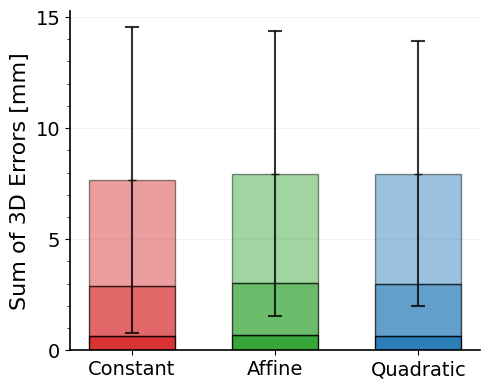

In [20]:
def rotate_to_3d(y_vals, s_vals, phi_rad):
    x = y_vals * np.cos(phi_rad)
    y = y_vals * np.sin(phi_rad)
    z = s_vals
    return x, y, z

def get_points_at_fractions(s_vals, y_vals, phi_rad, fractions=[1/3, 2/3, 1.0]):
    x, y, z = rotate_to_3d(y_vals, s_vals, phi_rad)
    total_length = len(s_vals) - 1
    points = []
    for frac in fractions:
        idx = int(frac * total_length)
        points.append([x[idx], y[idx], z[idx]])
    return np.array(points)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
plotter = PlotCurvature()

quad_model = torch.jit.load("models/curvature/quadratic_model.pt", map_location=device).eval()
affine_model = torch.jit.load("models/curvature/affine_model.pt", map_location=device).eval()
const_model = torch.jit.load("models/curvature/const_model.pt", map_location=device).eval()

errors_by_fraction = {
    "quad": {1/3: [], 2/3: [], 1.0: []},
    "affine": {1/3: [], 2/3: [], 1.0: []},
    "const": {1/3: [], 2/3: [], 1.0: []}
}
errors_by_model = {"quad": [], "affine": [], "const": []}

for (
    (img_y, _),
    (_, lbl_quad),
    (_, lbl_affine),
    (_, lbl_const)
) in zip(
    test_loader_y,
    loaders["quad"]["test"],
    loaders["affine"]["test"],
    loaders["const"]["test"]
):
    for i in range(len(img_y)):
        image = img_y[i:i+1].to(device)

        S_gt_quad, c0_gt_quad, c1_gt_quad, c2_gt_quad, phi_gt_quad = lbl_quad[i].cpu().numpy()
        S_gt_affine, c0_gt_affine, c1_gt_affine, phi_gt_affine = lbl_affine[i].cpu().numpy()
        S_gt_constant, c0_gt_constant, phi_gt_constant = lbl_const[i].cpu().numpy()

        with torch.no_grad():
            pred_quad = quad_model(image)[0].cpu().numpy()
            pred_affine = affine_model(image)[0].cpu().numpy()
            pred_const = const_model(image)[0].cpu().numpy()

        S_p_quad, c0_p_quad, c1_p_quad, c2_p_quad, phi_p_quad = pred_quad
        S_p_affine, c0_p_affine, c1_p_affine, phi_p_affine = pred_affine
        S_p_const, c0_p_const, phi_p_const = pred_const

        models_data = {
            "quad": {
                "gt_params": (S_gt_quad, c0_gt_quad, c1_gt_quad, c2_gt_quad, phi_gt_quad),
                "pred_params": (S_p_quad, c0_p_quad, c1_p_quad, c2_p_quad, phi_p_quad)
            },
            "affine": {
                "gt_params": (S_gt_affine, c0_gt_affine, c1_gt_affine, 0.0, phi_gt_affine),
                "pred_params": (S_p_affine, c0_p_affine, c1_p_affine, 0.0, phi_p_affine)
            },
            "const": {
                "gt_params": (S_gt_constant, c0_gt_constant, 0.0, 0.0, phi_gt_constant),
                "pred_params": (S_p_const, c0_p_const, 0.0, 0.0, phi_p_const)
            }
        }

        for model_name, params in models_data.items():
            s_gt, y_gt = plotter.curvature(*params["gt_params"][:4])
            points_gt = get_points_at_fractions(s_gt, y_gt, params["gt_params"][4])
            s_pred, y_pred = plotter.curvature(*params["pred_params"][:4])
            points_pred = get_points_at_fractions(s_pred, y_pred, params["pred_params"][4])
            for j, fraction in enumerate([1/3, 2/3, 1.0]):
                error = np.linalg.norm(points_pred[j] - points_gt[j])
                errors_by_fraction[model_name][fraction].append(error)
            total_error = np.sum(np.linalg.norm(points_pred - points_gt, axis=1))
            errors_by_model[model_name].append(total_error)

overall_means = {
    model: {frac: np.mean(errors_by_fraction[model][frac]) for frac in [1/3, 2/3, 1.0]}
    for model in ["quad", "affine", "const"]
}
overall_stds = {model: np.std(errors_by_model[model], ddof=1) for model in ["quad", "affine", "const"]}

colors = {
    "quad": "tab:blue",
    "affine": "tab:green",
    "const": "tab:red"
}

models = ["const", "affine", "quad"]
model_labels = ["Constant", "Affine", "Quadratic"]
fractions = [1/3, 2/3, 1.0]

fig, ax = plt.subplots(figsize=(5, 4))

x_pos = np.arange(len(models))
bar_width = 0.6
alpha_levels = [0.95, 0.70, 0.45]

for i, m in enumerate(models):
    seg = [overall_means[m][f] for f in fractions]
    total_height = sum(seg)
    std_dev = overall_stds[m]
    bottom = 0.0
    for j, val in enumerate(seg):
        ax.bar(
            x_pos[i], val, bar_width, bottom=bottom,
            color=colors[m], alpha=alpha_levels[j],
            edgecolor='black'  # <-- Added black border around bars
        )
        bottom += val
    ax.errorbar(
        x_pos[i], total_height, yerr=std_dev,
        fmt='k_', capsize=5, capthick=1.5, lw=1.5, alpha=0.8
    )

ax.set_ylabel("Sum of 3D Errors [mm]", fontsize=16)
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels, fontsize=14)
ax.tick_params(axis='y', labelsize=14)  
ax.yaxis.set_major_locator(plt.MultipleLocator(5))
ax.yaxis.set_minor_locator(plt.MultipleLocator(1))
ax.grid(True, axis='y', which='major', linestyle='-', alpha=0.2, linewidth=0.5)
ax.set_axisbelow(True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.2)
ax.spines['bottom'].set_linewidth(1.2)
ax.set_ylim(bottom=0)

plt.tight_layout()
plt.show()

## ⏰ Testing inverse kinematics

In [21]:
model = torch.jit.load("models/kinematics/kinematics_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []
all_PCC_labels = []

DELTAL0 = np.array([1e-4, 1e-4, 1e-4])
DxDyDl0 = np.array([1e-4, 1e-4, 1e-4])
coords0 = np.array([1e-4, 1e-4, 145, 1e-4, 1e-4, 1e-4])

with torch.no_grad():
    for inputs, deltals in tqdm(test_loader_IK, desc="Evaluating"):
        inputs = inputs.to(device)
        deltals = deltals.to(device)
        batch_PCC = []
        inputs_np = inputs.cpu().numpy()
        for i in range(inputs_np.shape[0]):
            PCC_deltal, _, _ = coordinates2tendon(DELTAL0, DxDyDl0, coords0, inputs_np[i] - coords0[:3])
            batch_PCC.append(PCC_deltal)
        batch_PCC = np.array(batch_PCC)
        preds = model(inputs)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(deltals.cpu().numpy())
        all_PCC_labels.append(batch_PCC)
        del inputs, deltals, preds, batch_PCC

all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)
all_PCC_labels = np.concatenate(all_PCC_labels, axis=0)

param_names = [r'$\Delta L_1$ [mm]', r'$\Delta L_2$ [mm]', r'$\Delta L_3$ [mm]']

nn_mae_values = []
nn_std_values = []
pcc_mae_values = []
pcc_std_values = []

for i in range(3):
    nn_errors = np.abs(all_preds[:, i] - all_labels[:, i])
    nn_mae = np.mean(nn_errors)
    nn_std = np.std(nn_errors)
    nn_mae_values.append(nn_mae)
    nn_std_values.append(nn_std)
    pcc_errors = np.abs(all_PCC_labels[:, i] - all_labels[:, i])
    pcc_mae = np.mean(pcc_errors)
    pcc_std = np.std(pcc_errors)
    pcc_mae_values.append(pcc_mae)
    pcc_std_values.append(pcc_std)

import pandas as pd

nn_stats_data = {
    'Parameter': param_names,
    'MAE': [f"{mae:.2f}" for mae in nn_mae_values],
    'Std': [f"{std:.2f}" for std in nn_std_values]
}
nn_stats_df = pd.DataFrame(nn_stats_data)

pcc_stats_data = {
    'Parameter': param_names,
    'MAE': [f"{mae:.2f}" for mae in pcc_mae_values],
    'Std': [f"{std:.2f}" for std in pcc_std_values]
}
pcc_stats_df = pd.DataFrame(pcc_stats_data)

print("=" * 60)
print("INVERSE KINEMATICS EVALUATION RESULTS")
print("=" * 60)

print("\n--- Neural Network Statistics ---")
print(nn_stats_df.to_string(index=False))

print("\n--- PCC Model Statistics ---")
print(pcc_stats_df.to_string(index=False))

print("\n--- Comparative Summary ---")
print("Parameter | Neural Network (MAE±Std) | PCC Model (MAE±Std)")
print("----------|--------------------------|--------------------")
for i in range(3):
    nn_mae = nn_mae_values[i]
    nn_std = nn_std_values[i]
    pcc_mae = pcc_mae_values[i]
    pcc_std = pcc_std_values[i]
    print(f"   ΔL{i+1}    |    {nn_mae:.2f}±{nn_std:.2f} mm        |   {pcc_mae:.2f}±{pcc_std:.2f} mm")


Evaluating: 100%|██████████| 8/8 [00:27<00:00,  3.41s/it]

INVERSE KINEMATICS EVALUATION RESULTS

--- Neural Network Statistics ---
        Parameter  MAE  Std
$\Delta L_1$ [mm] 0.81 0.91
$\Delta L_2$ [mm] 1.10 1.55
$\Delta L_3$ [mm] 0.66 0.71

--- PCC Model Statistics ---
        Parameter  MAE  Std
$\Delta L_1$ [mm] 1.94 1.64
$\Delta L_2$ [mm] 2.28 2.26
$\Delta L_3$ [mm] 1.74 1.58

--- Comparative Summary ---
Parameter | Neural Network (MAE±Std) | PCC Model (MAE±Std)
----------|--------------------------|--------------------
   ΔL1    |    0.81±0.91 mm        |   1.94±1.64 mm
   ΔL2    |    1.10±1.55 mm        |   2.28±2.26 mm
   ΔL3    |    0.66±0.71 mm        |   1.74±1.58 mm


## ⏰ Testing Curvature regressors for multisection

Quadratic

In [13]:
model = torch.jit.load("models/curvature/quadratic_for_MULTI_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader_quad:
        images = images.to(device)
        labels = labels.to(device)
        preds = model(images)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())
        del images, labels, preds

all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

S, c0, c1, c2 = all_preds[:, 0], all_preds[:, 1], all_preds[:, 2], all_preds[:, 3]
S_true, c0_true, c1_true, c2_true = all_labels[:, 0], all_labels[:, 1], all_labels[:, 2], all_labels[:, 3]

n_points = 100
v = np.linspace(0, 1, n_points)
s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None]*s_true + 0.5*c1_true[:, None]*s_true**2 + (1/3)*c2_true[:, None]*s_true**3
sin_theta_true = np.sin(theta_true)
pi_true = np.trapz(sin_theta_true, s_true, axis=1)

param_names = ['S [mm]', r'$c_0$', r'$c_1$', r'$c_2$']

mae_values = []
std_values = []
for i in range(4):
    errors = np.abs(all_preds[:, i] - all_labels[:, i])
    mae = np.mean(errors)
    std = np.std(errors)
    mae_values.append(mae)
    std_values.append(std)

delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)
mae_phi = np.mean(delta_phi)
std_phi = np.std(delta_phi)

import pandas as pd

param_stats_data = {
    'Parameter': param_names,
    'MAE': [f"{mae:.2e}" if i in [1,2,3] else f"{mae:.2f}" for i, mae in enumerate(mae_values)],
    'Std': [f"{std:.2e}" if i in [1,2,3] else f"{std:.2f}" for i, std in enumerate(std_values)]
}
param_stats_df = pd.DataFrame(param_stats_data)

angle_stats_data = {
    'Error Type': [r'Angular Error φ [°]'],
    'MAE': [f"{mae_phi:.2f}"],
    'Std': [f"{std_phi:.2f}"]
}
angle_stats_df = pd.DataFrame(angle_stats_data)

print("=" * 60)
print("QUADRATIC FOR MULTI MODEL EVALUATION RESULTS")
print("=" * 60)

print("\n--- Parameter-wise Error Statistics ---")
print(param_stats_df.to_string(index=False))

print("\n--- Angular Error Statistics ---")
print(angle_stats_df.to_string(index=False))


QUADRATIC FOR MULTI MODEL EVALUATION RESULTS

--- Parameter-wise Error Statistics ---
Parameter      MAE      Std
   S [mm]     0.69     0.79
    $c_0$ 2.66e-04 3.62e-04
    $c_1$ 1.13e-05 1.73e-05
    $c_2$ 8.87e-08 1.39e-07

--- Angular Error Statistics ---
         Error Type  MAE   Std
Angular Error φ [°] 7.24 12.58


Affine

In [14]:
model = torch.jit.load("models/curvature/affine_for_MULTI_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader_affine:
        images = images.to(device)
        labels = labels.to(device)
        preds = model(images)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())

all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

S = all_preds[:, 0]
c0 = all_preds[:, 1]
c1 = all_preds[:, 2]
S_true = all_labels[:, 0]
c0_true = all_labels[:, 1]
c1_true = all_labels[:, 2]

n_points = 100
v = np.linspace(0, 1, n_points)
s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None] * s_true + 0.5 * c1_true[:, None] * s_true**2
pi_true = np.trapz(np.sin(theta_true), s_true, axis=1)

param_names = ['S [mm]', r'$c_0$', r'$c_1$']

mae_values = []
std_values = []
for i in range(3):
    errors = np.abs(all_preds[:, i] - all_labels[:, i])
    mae = np.mean(errors)
    std = np.std(errors)
    mae_values.append(mae)
    std_values.append(std)

delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)
mae_phi = np.mean(delta_phi)
std_phi = np.std(delta_phi)

import pandas as pd

param_stats_data = {
    'Parameter': param_names,
    'MAE': [f"{mae:.2e}" if i in [1,2] else f"{mae:.2f}" for i, mae in enumerate(mae_values)],
    'Std': [f"{std:.2e}" if i in [1,2] else f"{std:.2f}" for i, std in enumerate(std_values)]
}
param_stats_df = pd.DataFrame(param_stats_data)

angle_stats_data = {
    'Error Type': [r'Angular Error φ [°]'],
    'MAE': [f"{mae_phi:.2f}"],
    'Std': [f"{std_phi:.2f}"]
}
angle_stats_df = pd.DataFrame(angle_stats_data)

print("=" * 60)
print("AFFINE FOR MULTI MODEL EVALUATION RESULTS")
print("=" * 60)

print("\n--- Parameter-wise Error Statistics ---")
print(param_stats_df.to_string(index=False))

print("\n--- Angular Error Statistics ---")
print(angle_stats_df.to_string(index=False))


AFFINE FOR MULTI MODEL EVALUATION RESULTS

--- Parameter-wise Error Statistics ---
Parameter      MAE      Std
   S [mm]     0.65     0.76
    $c_0$ 1.22e-04 1.44e-04
    $c_1$ 1.91e-06 2.33e-06

--- Angular Error Statistics ---
         Error Type  MAE   Std
Angular Error φ [°] 7.22 11.78


In [15]:
model = torch.jit.load("models/curvature/constant_for_MULTI_model.pt", map_location=device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader_const:
        images = images.to(device)
        labels = labels.to(device)
        preds = model(images)
        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())

all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

phi_pred = np.rad2deg(all_preds[:, -1])
phi_true = np.rad2deg(all_labels[:, -1])

S = all_preds[:, 0]
c0 = all_preds[:, 1]
S_true = all_labels[:, 0]
c0_true = all_labels[:, 1]

n_points = 100
v = np.linspace(0, 1, n_points)
s_true = S_true[:, None] * v[None, :]
theta_true = c0_true[:, None] * s_true
pi_true = np.trapz(np.sin(theta_true), s_true, axis=1)

param_names = ['S [mm]', r'$c_0$']

mae_values = []
std_values = []
for i in range(2):
    errors = np.abs(all_preds[:, i] - all_labels[:, i])
    mae = np.mean(errors)
    std = np.std(errors)
    mae_values.append(mae)
    std_values.append(std)

delta_phi = np.abs((phi_pred - phi_true + 180) % 360 - 180)
mae_phi = np.mean(delta_phi)
std_phi = np.std(delta_phi)

import pandas as pd

param_stats_data = {
    'Parameter': param_names,
    'MAE': [f"{mae:.2f}" if i == 0 else f"{mae:.2e}" for i, mae in enumerate(mae_values)],
    'Std': [f"{std:.2f}" if i == 0 else f"{std:.2e}" for i, std in enumerate(std_values)]
}
param_stats_df = pd.DataFrame(param_stats_data)

angle_stats_data = {
    'Error Type': [r'Angular Error φ [°]'],
    'MAE': [f"{mae_phi:.2f}"],
    'Std': [f"{std_phi:.2f}"]
}
angle_stats_df = pd.DataFrame(angle_stats_data)

print("=" * 60)
print("CONSTANT FOR MULTI MODEL EVALUATION RESULTS")
print("=" * 60)

print("\n--- Parameter-wise Error Statistics ---")
print(param_stats_df.to_string(index=False))

print("\n--- Angular Error Statistics ---")
print(angle_stats_df.to_string(index=False))


CONSTANT FOR MULTI MODEL EVALUATION RESULTS

--- Parameter-wise Error Statistics ---
Parameter      MAE      Std
   S [mm]     0.64     0.75
    $c_0$ 7.58e-05 6.43e-05

--- Angular Error Statistics ---
         Error Type  MAE   Std
Angular Error φ [°] 6.40 10.55


## Grad-CAM for tip pose

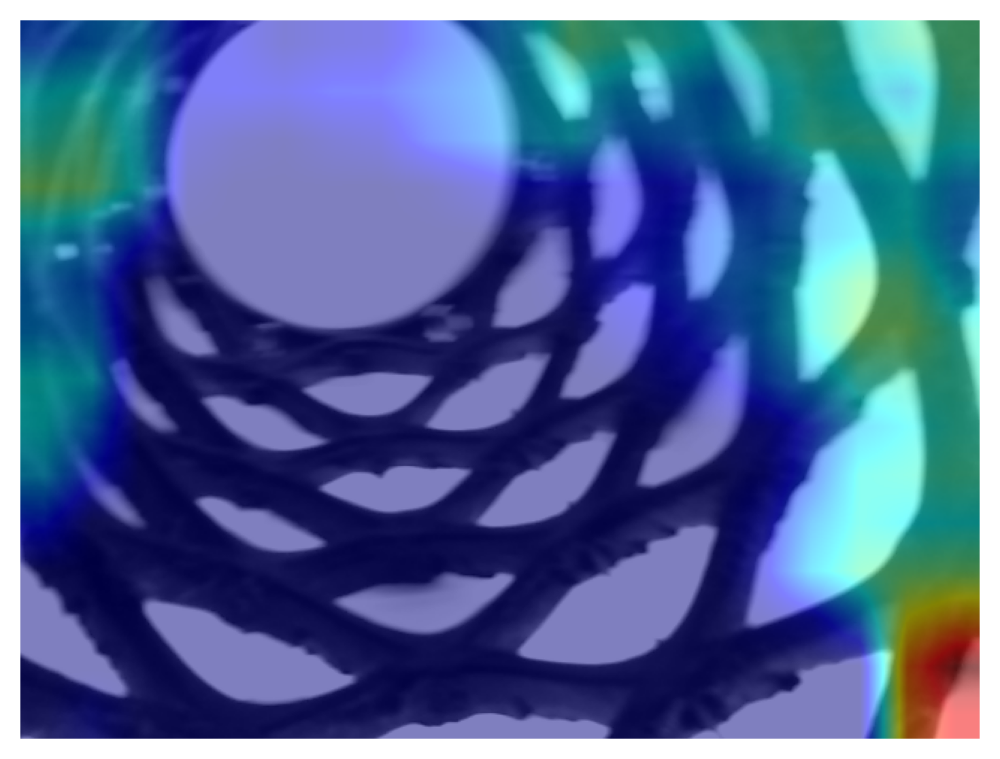

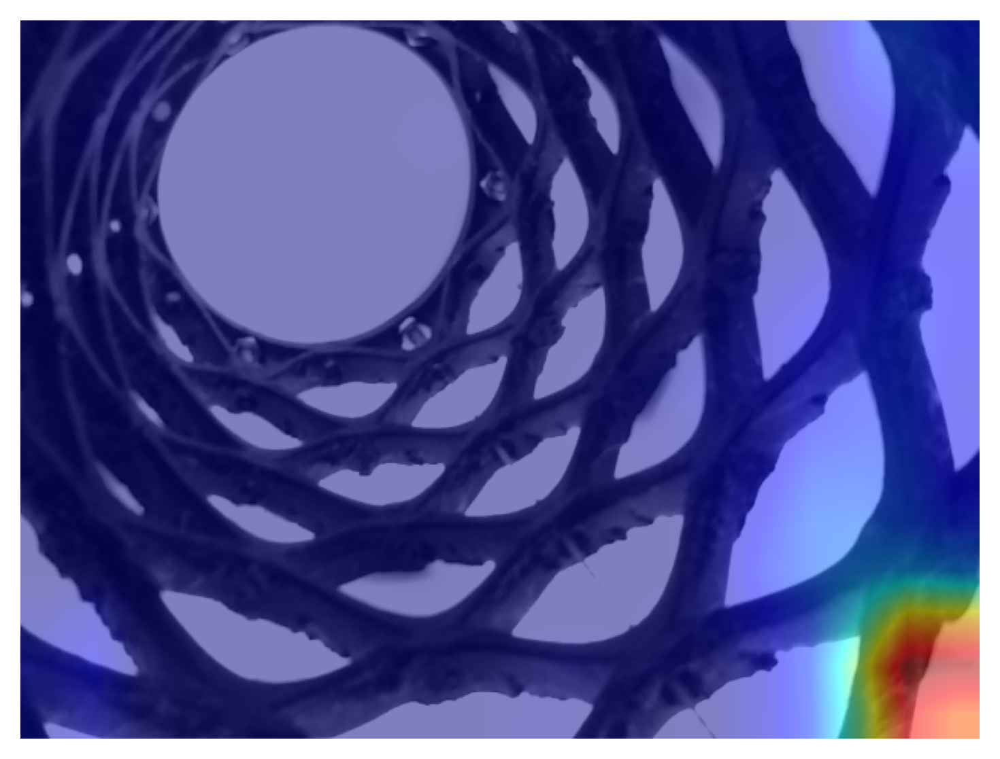

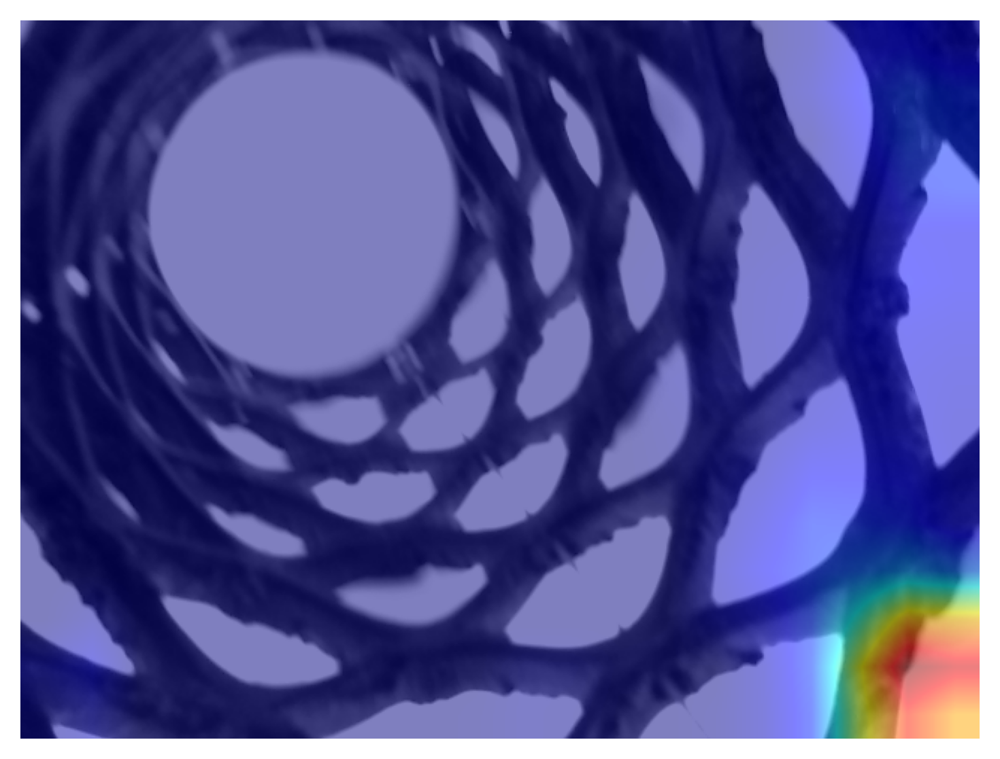

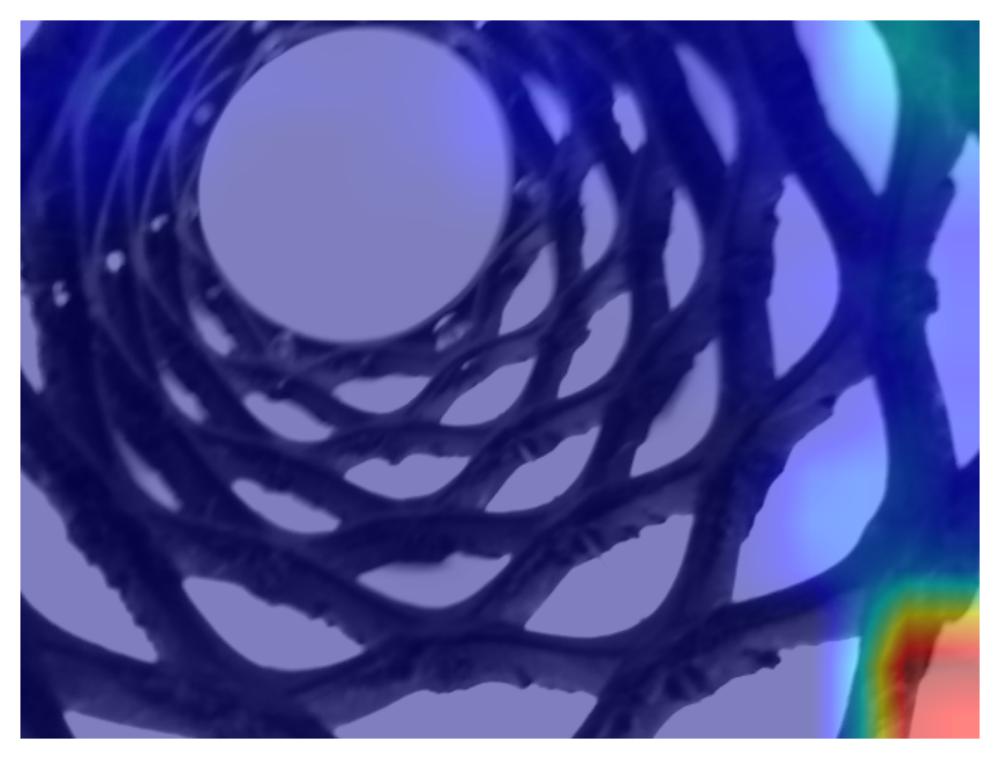

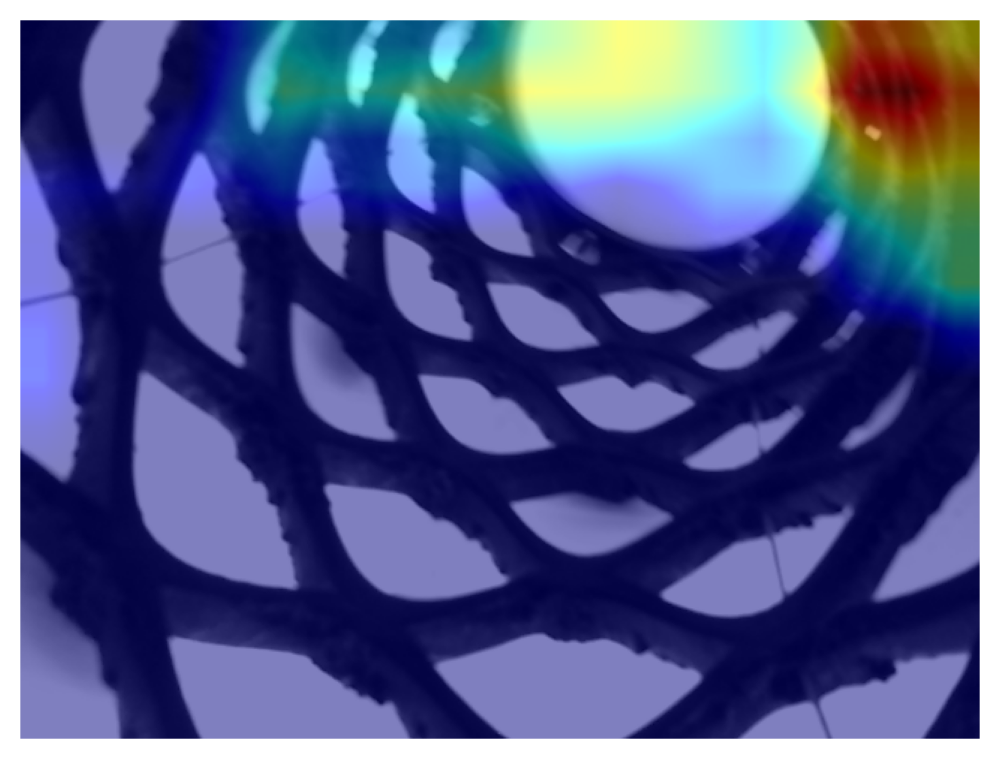

...

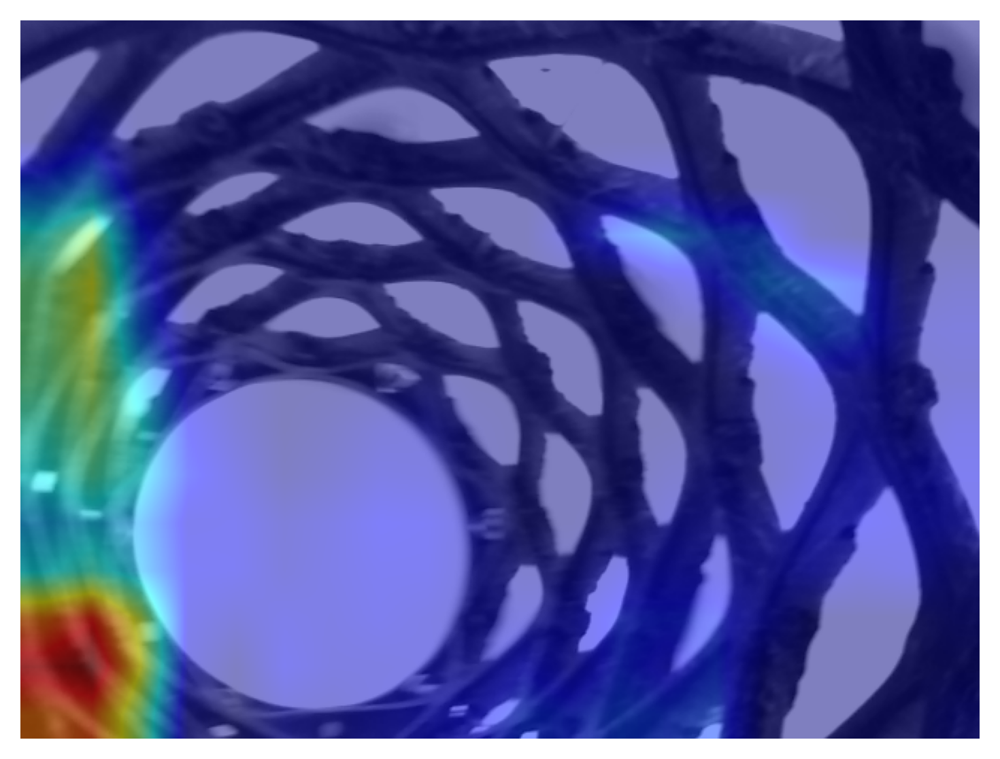

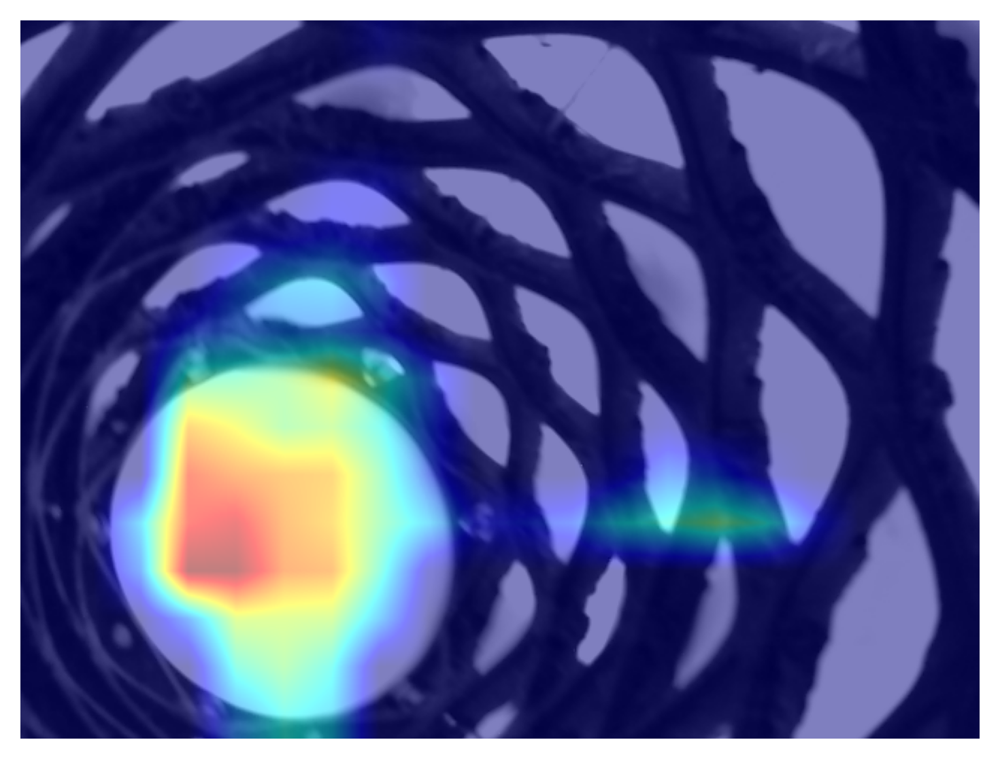

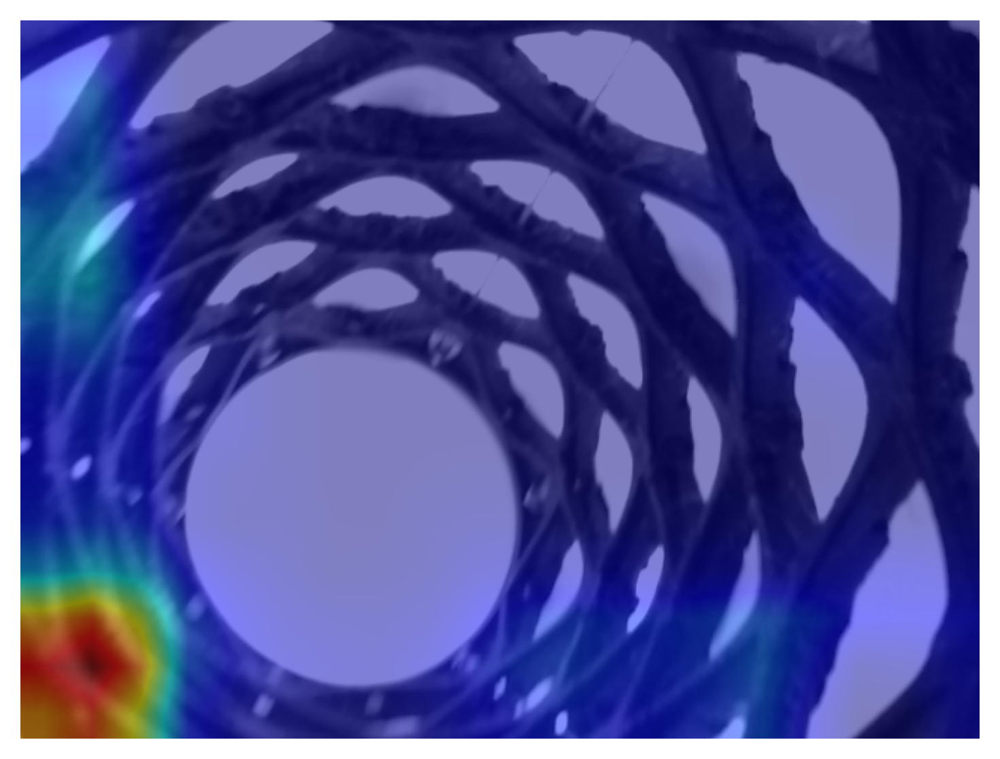

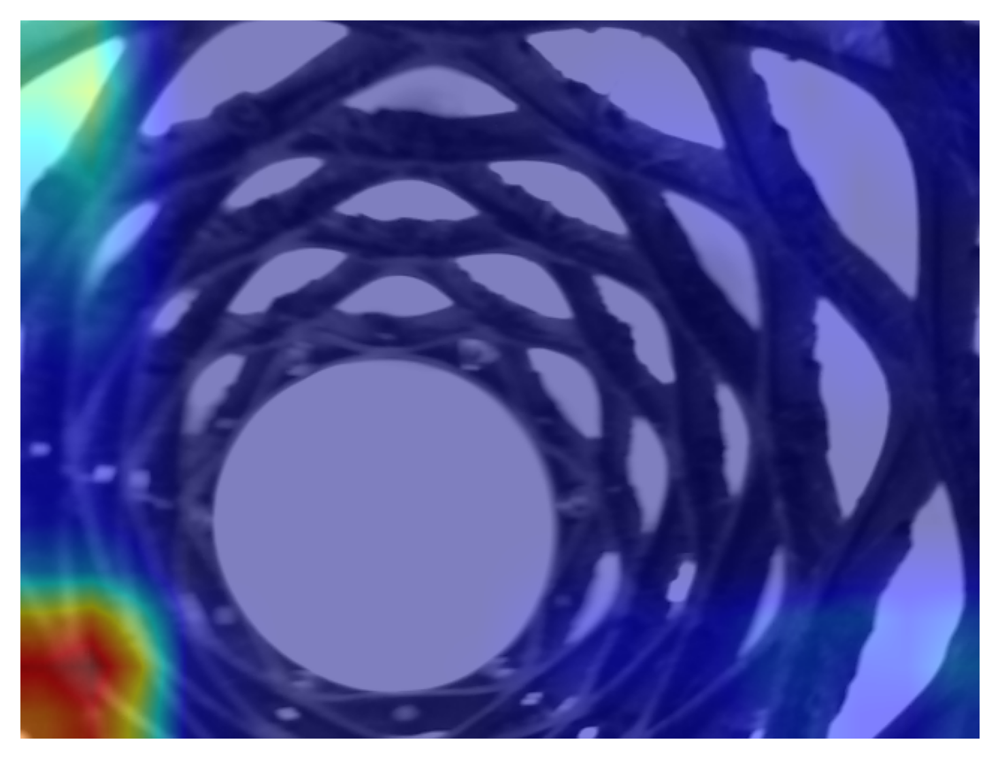

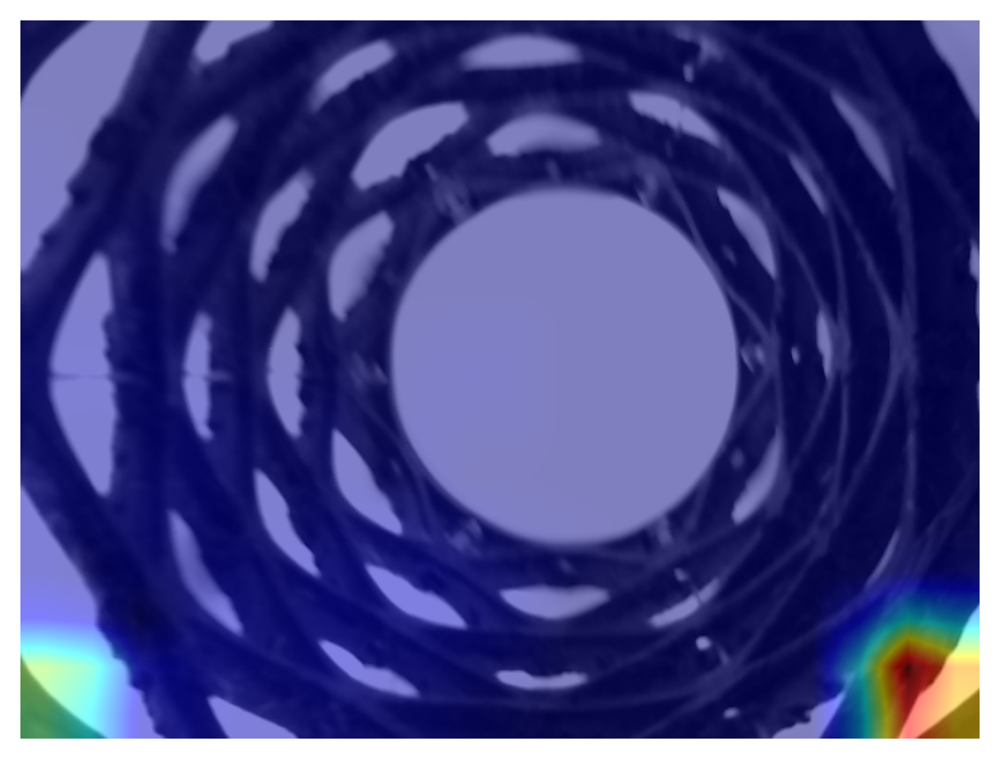

In [20]:
MODEL_PATH = "models/vision/helyx_model_normalized.pt"
STATS_PATH = "label_stats.pt"
ALPHA = 0.5

# --- wrappers/targets ---
class DenormalizedModel(nn.Module):
    def __init__(self, base_model, mean, std):
        super().__init__()
        self.base_model = base_model
        self.register_buffer("mean", mean)
        self.register_buffer("std", std)
    def forward(self, x):
        return self.base_model(x) * self.std + self.mean

class MSETarget:
    def __init__(self, y_true):
        self.y_true = y_true
    def __call__(self, model_output):
        return -F.mse_loss(model_output.squeeze(0), self.y_true, reduction="sum")

# --- load model + stats ---
model = torch.load(MODEL_PATH, map_location=device)
stats = torch.load(STATS_PATH, map_location=device)
mean, std = stats["mean"].to(device), stats["std"].to(device)
final_model = DenormalizedModel(model, mean, std).to(device).eval()

# --- pick last conv layers ---
convs = [m for m in final_model.base_model.backbone.modules() if isinstance(m, torch.nn.Conv2d)]
target_layers = convs[-1:]
cam = GradCAM(model=final_model, target_layers=target_layers)

best_points = {"Q1": [], "Q2": [], "Q3": [], "Q4": []}
distances = []
N = len(test_loader_y.dataset)

for i in range(N):
    _, lbl = test_loader_y.dataset[i]
    x, y = float(lbl[0]), float(lbl[1])
    dist = np.sqrt(x**2 + y**2)
    score = dist - ALPHA * abs(abs(x) - abs(y))
    distances.append((dist, i, (x, y)))

    if x > 0 and y > 0:
        best_points["Q1"].append((i, score, (x, y)))
    elif x < 0 and y > 0:
        best_points["Q2"].append((i, score, (x, y)))
    elif x < 0 and y < 0:
        best_points["Q3"].append((i, score, (x, y)))
    elif x > 0 and y < 0:
        best_points["Q4"].append((i, score, (x, y)))

for k in best_points:
    best_points[k] = sorted(best_points[k], key=lambda t: t[1], reverse=True)[:4]

distances = sorted(distances, key=lambda t: t[0])[:1]
best_points["Center"] = [(i, d, (x, y)) for d, i, (x, y) in distances]

for key in ["Q1", "Q2", "Q3", "Q4", "Center"]:
    for idx, score, (x, y) in best_points[key]:
        img, y_true = test_loader_y.dataset[idx]
        img_t = img.unsqueeze(0).to(device).float()
        y_true = y_true.to(device).float()
        grayscale_cam = cam(input_tensor=img_t, targets=[MSETarget(y_true)], aug_smooth=False)[0]
        if np.max(grayscale_cam) > 0:
            grayscale_cam = grayscale_cam / np.max(grayscale_cam)

        vis = (img_t.squeeze(0).detach().cpu().numpy().transpose(1, 2, 0) / 255.0).clip(0, 1)
        cam_img = show_cam_on_image(vis, grayscale_cam, use_rgb=True)

        plt.figure(figsize=(5, 5))
        plt.imshow(cam_img)
        plt.axis("off")
        plt.tight_layout()
        plt.show()


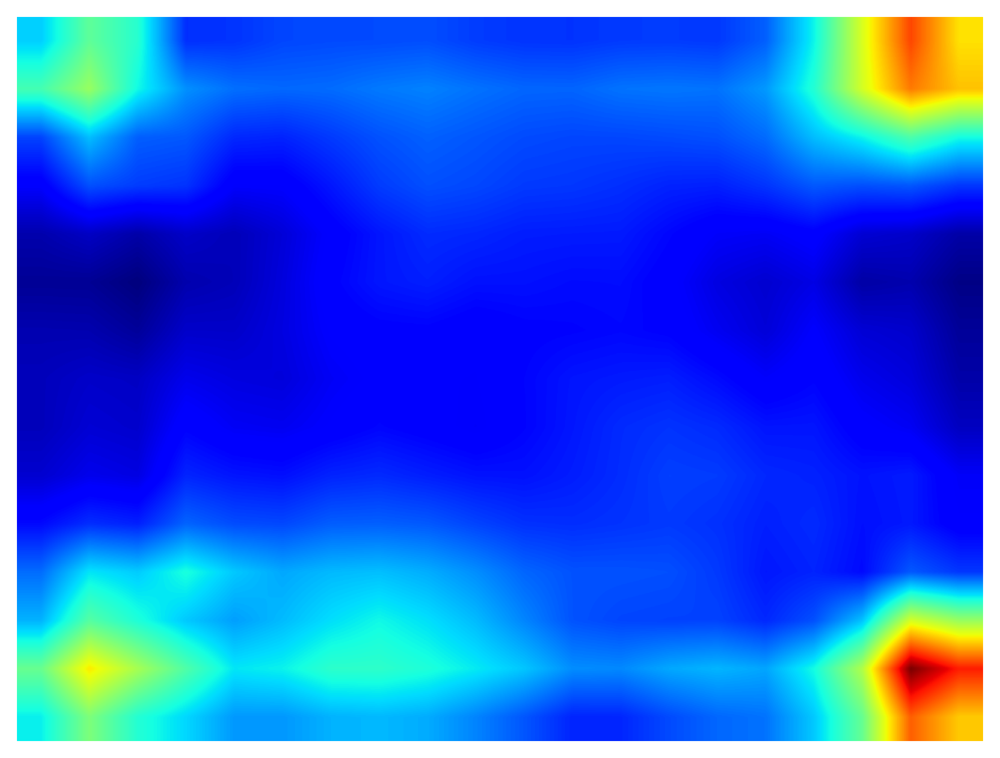

In [17]:
def compute_mean_gradcam(loader, cam, device):
    heatmap_sum = None
    num_samples = 0
    for i in range(len(loader.dataset)):
        image, label = loader.dataset[i]
        image_tensor = image.unsqueeze(0).to(device).float()
        y_true = label.to(device).float()
        grayscale_cam = cam(input_tensor=image_tensor, targets=[MSETarget(y_true)], aug_smooth=False)[0]
        if np.max(grayscale_cam) > 0:
            grayscale_cam = grayscale_cam / np.max(grayscale_cam)
        if heatmap_sum is None:
            heatmap_sum = grayscale_cam.copy()
        else:
            heatmap_sum += grayscale_cam
        num_samples += 1
        del image_tensor, grayscale_cam
        torch.cuda.empty_cache()
    return heatmap_sum / num_samples

model = torch.load("models/vision/helyx_model_normalized.pt", map_location=device)
stats = torch.load("label_stats.pt", map_location=device)
mean = stats['mean'].to(device)
std = stats['std'].to(device)

final_model = DenormalizedModel(model, mean, std).to(device).eval()

conv_layers = [m for m in final_model.base_model.backbone.modules() if isinstance(m, torch.nn.Conv2d)]
target_layers = conv_layers[-1:]
cam = GradCAM(model=final_model, target_layers=target_layers)

mean_test = compute_mean_gradcam(test_loader_y, cam, device)

plt.figure(figsize=(6, 6))
plt.imshow(mean_test, cmap='jet')
plt.axis('off')
plt.tight_layout()
plt.show()
